# Setup

In [4]:
from notebook.services.config import ConfigManager
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))
c = ConfigManager()
_ = c.update('notebook', {"CodeCell": {"cm_config": {"autoCloseBrackets": False}}})

In [5]:
import numpy as np
import powerlaw
import re
import time
import yaml
import h5py
from pprint import pprint
from pathlib import Path
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

In [6]:
# Plotting style configuration
# print(plt.rcParams.keys())
otrap_sty = {
    "axes.titlesize": 20,
    "axes.labelsize": 24,
    "lines.linewidth": 1,
    "lines.markersize": 10,
    "xtick.labelsize": 24,
    "ytick.labelsize": 24,
    "font.size": 20,
    "font.sans-serif": 'Helvetica',
    "text.usetex": False,
    'mathtext.fontset': 'cm',
}
plt.style.use(otrap_sty)

In [7]:
SQRT_PI = np.sqrt(np.pi)
sec = .0357  # sec
um = .025  # um
pN = .1644  # pN
nm = 25.  # nm
nM = 106382.978723404  # nM for molecular simulations
nM_fp = 1147.604948473  # nM for PDE and ME simulations

In [8]:
#ot_path = Path('/Users/mnt/home/alamson/projects/DATA/Optical-Traps/')

ot_path = Path.home() / 'projects/DATA/Optical-Traps/'
ot_ceph_path = Path.home() / 'ceph/DATA/Optical-Traps/'

# Functions

In [9]:
def contiguous_regions(condition):
    """By Joe Kington, Finds contiguous True regions of the boolean array 
    "condition". Returns a 2D array where the first column is the start 
    index of the region and the second column is the end index.
    http://stackoverflow.com/questions/4494404/find-large-number-of-consecutive-values-fulfilling-condition-in-a-numpy-array"""

    # Find the indices of changes in "condition"
    d = np.diff(condition.astype(int))
    idx, = d.nonzero()

    # We need to start things after the change in "condition". Therefore,
    # we'll  shift the index by 1 to the right.
    idx += 1

    if condition[0]:
        # if the end of the start of condition is True prepend a 0
        idx = np.r_[0, idx]

    if condition[-1]:
        # if the end of condtion is True, append the length of the array
        idx = np.r_[idx, condition.size]

    idx.shape = (-1, 2)
    return idx

In [10]:
def get_ot_force(h5_data, species_name='filament-trap'):
    """ Get force on bead from optical based on position"""
    k_spring = h5_data['optical_trap_data/' +
                       species_name].attrs['trap_spring']
    trap_pos_arr = h5_data['optical_trap_data/' +
                           species_name + '/trap_position'][:, :, 0]
    bead_pos_arr = h5_data['optical_trap_data/' +
                           species_name + '/bead_position'][:, :, 0]
    time = h5_data['optical_trap_data/' + species_name + '/time'][...]
    return time, k_spring * (trap_pos_arr - bead_pos_arr)

In [11]:
def get_crosslink_number(h5_data, species_name='kinesin'):
    """ Get crosslink_number on filaments"""
    dbl_xlinks_dset = h5_data['crosslink_data/' +
                         species_name + '/doubly_bound']
    #h5_data.visit(lambda x: print(x))
    sgl_xlink_dset = h5_data['crosslink_data/' +
                        species_name + '/singly_bound']
    
    dbl_xlink_num = np.asarray([xl[0].size for xl in dbl_xlinks_dset])
    #print(dbl_xlink_num)
    sgl_xlink_num = np.asarray([[xl[0].size, xl[1].size] for xl in sgl_xlink_dset])
    time = h5_data['crosslink_data/' + species_name + '/time'][...]
    return time, dbl_xlink_num, sgl_xlink_num


In [30]:
def get_dbl_xlink_number(h5_data, species_name='kinesin', overwrite=False):
    """ Get crosslink_number on filaments"""
    xl_root = f'crosslink_data/{species_name}' 
    
    if f'crosslink_data/{species_name}/doubly_bound_num' in h5_data.keys():
        dbl_xlink_num = h5_data[xl_root + '/doubly_bound_num'][...]
    else:
        dbl_xlinks_dset = h5_data[xl_root + '/doubly_bound']
        dbl_xlink_num = np.asarray([xl[0].size for xl in dbl_xlinks_dset])
        
    time = h5_data[xl_root + '/time'][...]
    return time, dbl_xlink_num

# Test graphs

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


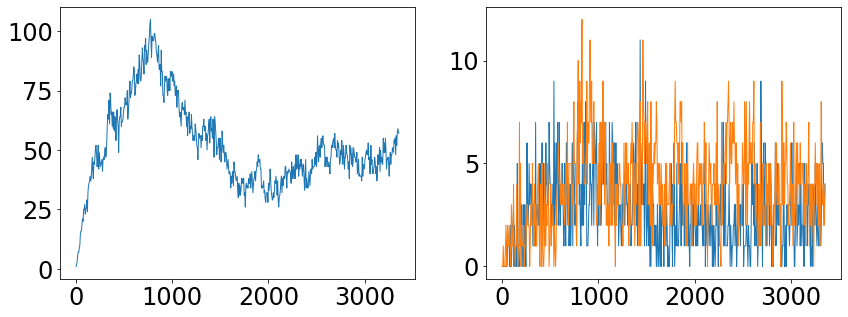

In [13]:
try:
    dir_path = ot_ceph_path / '21-06-04_CG_OT_stat_kin5_ase1_Edep.5_5um_conc1e-5'
    fig, axarr = plt.subplots(1, 2, figsize=(14, 5))
    seed_dat_path = dir_path.glob('*.h5')
    h5_data = h5py.File(next(seed_dat_path), 'r')
    time, dbl_xlink_num, sgl_xlink_num = get_crosslink_number(h5_data)
    axarr[0].plot(time, dbl_xlink_num)
    axarr[1].plot(time, sgl_xlink_num)
    #axarr[1].plot(time*sec, -ot_force[:,1]*pN)
except BaseException:
    raise
finally:
    h5_data.close()


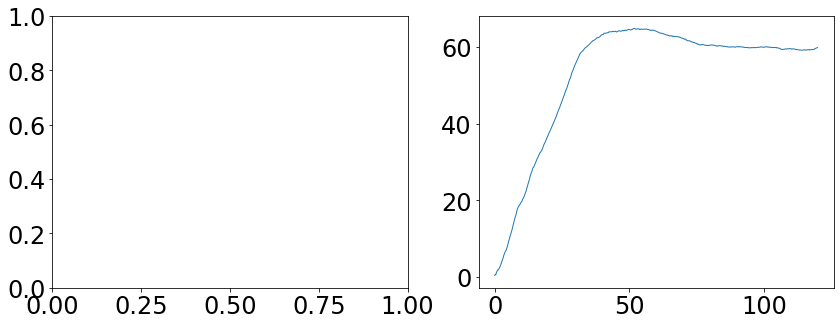

In [14]:
# Single graph idea
try:
    dir_path = ot_ceph_path / '21-06-04_CG_OT_stat_kin5_ase1_Edep.5_5um_conc1e-5'
    fig, axarr = plt.subplots(1,2, figsize=(14,5))
    seed_dat_path = dir_path.glob('*.h5')
    h5_data = h5py.File(next(seed_dat_path), 'r')
    time, ot_force = get_ot_force(h5_data)
    axarr[1].plot(time*sec, -ot_force[:,1]*pN)
except:
    raise
finally:
    h5_data.close()

# Parameter scan force plots

In [15]:
def get_suff(path):
    scinote = re.compile('[+-]?\d+(?:\.?\d*(?:[eE][+-]?\d+)?)?')
    # This is a little cludgy but it works sometimes
    # return float(path.suffixes[-1]) if len(path.suffixes) > 0 else 0.
    patterns = re.findall(scinote, str(path))
    #print(patterns)
    return float(patterns[-1]) # only return the last one for now

In [16]:
def param_scan_force_plot(axarr, param_dirs, param_name=''):
    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
    #get_suff = lambda x: float(x.suffixes[0]) if len(x.suffixes) > 0 else 0
    for param_dir, color in zip(param_dirs, color_cycle):
        seed_dat_paths = param_dir.glob('s*/*.h5')
        label_flag = True
        ot_force_arr = []
        for s in seed_dat_paths:
            h5_data = h5py.File(s, 'r')
            time, ot_force = get_ot_force(h5_data)
            ot_force_arr += [ot_force[:,1]]
            if label_flag:
                label = "{} = {}".format(param_name, get_suff(param_dir))
                axarr[1].plot(time*sec, -ot_force[:,1]*pN, c=color, label = label)
                label_flag = False
                print(label, end=", ")
            else:
                pass
                #ax.plot(time*sec, -ot_force[:,1]*pN, c=color)
            h5_data.close()
        if not ot_force_arr:
            continue
        min_time_ind = min([len(otf) for otf in ot_force_arr])
        ot_force_arr = [otf[:min_time_ind] for otf in ot_force_arr]
        ot_force_arr = np.asarray(ot_force_arr)
        axarr[0].plot(time*sec, -(ot_force_arr.mean(axis=0))*pN, c=color)
        #print(ot_force_arr.shape)
    print(" ")
    axarr[0].set_xlabel('Time $t$ (sec)')
    axarr[1].set_xlabel('Time $t$ (sec)')
    axarr[0].set_ylabel('Force $F_x$ (pN)')
    axarr[1].legend(loc='center left', bbox_to_anchor=(1.05, .5))

In [17]:
def param_scan_xlink_num_plot(axarr, param_dirs, param_name='', species='kinesin'):
    color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']
    for param_dir, color in zip(param_dirs, color_cycle):
        seed_dat_paths = param_dir.glob('s*/*.h5')
        label_flag = True
        dbl_xlink_num_arr = []
        #sgl_xlink_num_arr = []
        for s in seed_dat_paths:
            h5_data = h5py.File(s, 'r')
            try:
                time, dbl_xlink_num = get_dbl_xlink_number(h5_data, species_name=species)
            except:
                continue
            dbl_xlink_num_arr += [dbl_xlink_num]
            if label_flag:
                label = "{} = {}".format(param_name, get_suff(param_dir))
                axarr[1].plot(time*sec, dbl_xlink_num, c=color, label = label)
                label_flag = False
                print(label, end=", ")
            else:
                pass
            h5_data.close()
        if not dbl_xlink_num_arr:
            continue
        min_time_ind = min([len(xln) for xln in dbl_xlink_num_arr])
        dbl_xlink_num_arr = [xln[:min_time_ind] for xln in dbl_xlink_num_arr]
        dbl_xlink_num_arr = np.asarray(dbl_xlink_num_arr)
        axarr[0].plot(time*sec, (dbl_xlink_num_arr.mean(axis=0)), c=color)
    print(" ")
    axarr[0].set_xlabel('Time $t$ (sec)')
    axarr[1].set_xlabel('Time $t$ (sec)')
    axarr[0].set_ylabel(f'Doubly bound {species}')
    axarr[1].legend(loc='center left', bbox_to_anchor=(1.05, .5))

In [33]:
def make_force_kin_ase1_graphs(dir_path, prefix='xlc'):
    try:
        param_dirs = (dir_path / 'simulations').glob(f'{prefix}*')
        param_dirs = sorted(param_dirs, key=get_suff)
        fig, axarr = plt.subplots(1,2, figsize=(14,5), sharey=True)
        try:
            param_scan_force_plot(axarr, param_dirs, prefix)
        except BaseException:
            pass
        fig.tight_layout()

        fig1, axarr1 = plt.subplots(1,2, figsize=(14,5), sharey=True)
        try:
            param_scan_xlink_num_plot(axarr1, param_dirs, prefix)
        except BaseException:
            pass
        fig1.tight_layout()

        fig2, axarr2 = plt.subplots(1,2, figsize=(14,5), sharey=True)
        try:
            param_scan_xlink_num_plot(axarr2, param_dirs, prefix, species='ase1')
        except BaseException:
            raise
        fig2.tight_layout()
    except BaseException:
        raise
    finally:
        pass

# Energy dependent unbinding plots

Edep = 0.0, Edep = 0.1, Edep = 0.2, Edep = 0.3, Edep = 0.4, Edep = 0.5, Edep = 0.6, Edep = 0.7, Edep = 0.8, Edep = 0.9,  
Edep = 0.0, Edep = 0.1, Edep = 0.2, Edep = 0.3, Edep = 0.4, Edep = 0.5, Edep = 0.6, Edep = 0.7, Edep = 0.8, Edep = 0.9,  


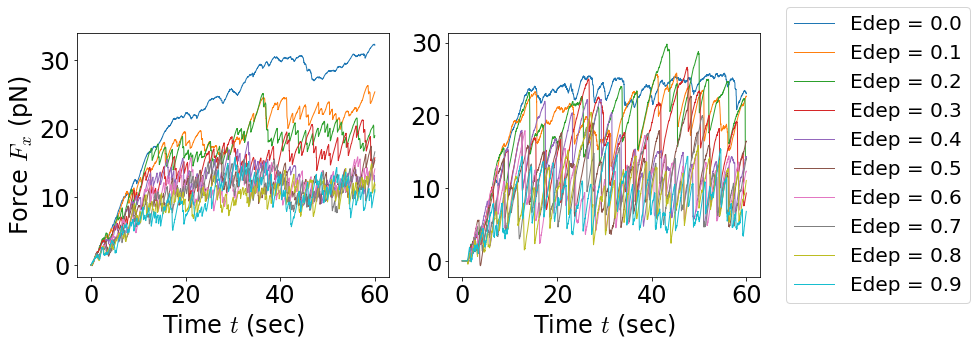

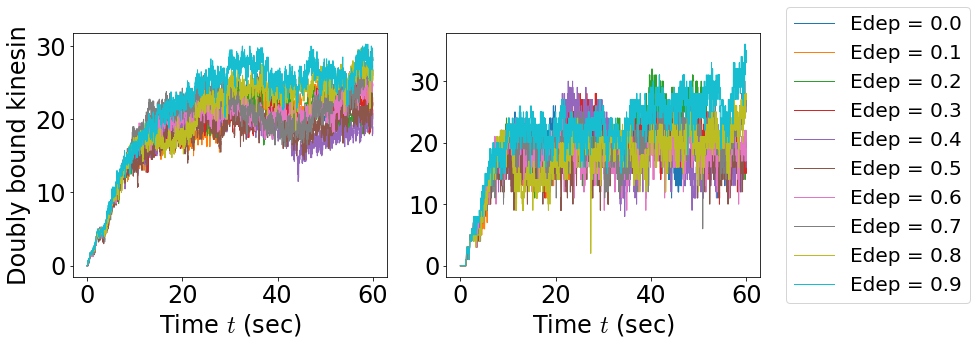

In [21]:
# Energy-dependent nzrl motors
dir_path = ot_ceph_path / '20-10-06_CG_OT_scan10.4_stat_rigid_kin5_Edep0.0-1.0'
try:
    edep_dirs = list((dir_path / 'simulations').glob('Edep0*'))
    edep_dirs = sorted(edep_dirs, key=get_suff)
    fig, axarr = plt.subplots(1,2, figsize=(14,5))
    try:
        param_scan_force_plot(axarr, edep_dirs, "Edep")
    except:
        pass
    fig.tight_layout()
    
    fig1, axarr1 = plt.subplots(1,2, figsize=(14,5))
    try:
        param_scan_xlink_num_plot(axarr1, edep_dirs, "Edep")
    except:
        pass
    fig1.tight_layout()
except:
    raise
finally:
    pass

Edep = 0.1
Edep = 0.2
Edep = 0.3
Edep = 0.4
Edep = 0.5
Edep = 0.6
Edep = 0.7
Edep = 0.8
Edep = 0.9


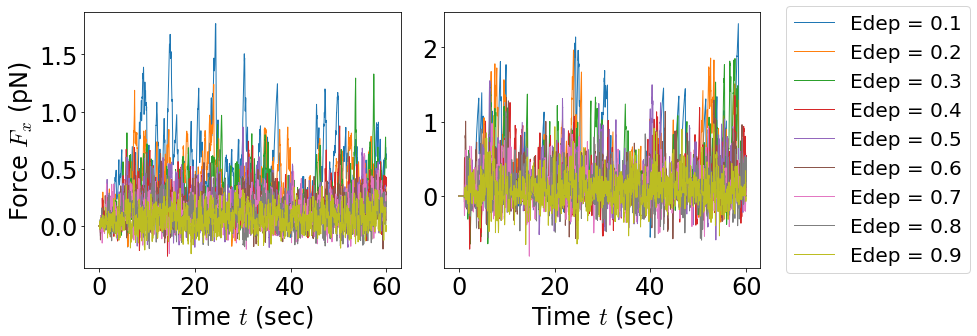

In [35]:
# Low concentration (c = .00001) energy-dependent zrl motors
dir_path = ot_ceph_path / '20-10-07_CG_OT_scan10.4_stat_rigid_zl-kin5_Edep0.0-1.0'
try:
    #edep_dirs = (dir_path / 'simulations').glob('Edep0*[!8-9]')
    
    edep_dirs = (dir_path / 'simulations').glob('Edep0.*')
    edep_dirs = sorted(edep_dirs, key=get_suff)
    fig, axarr = plt.subplots(1,2, figsize=(14,5))
    param_scan_force_plot(axarr, edep_dirs, "Edep")
    plt.tight_layout()
except:
    raise
finally:
    pass

Edep = 0.0
Edep = 0.1
Edep = 0.2
Edep = 0.3
Edep = 0.4
Edep = 0.5
Edep = 0.6
Edep = 0.7
Edep = 0.8
Edep = 0.9


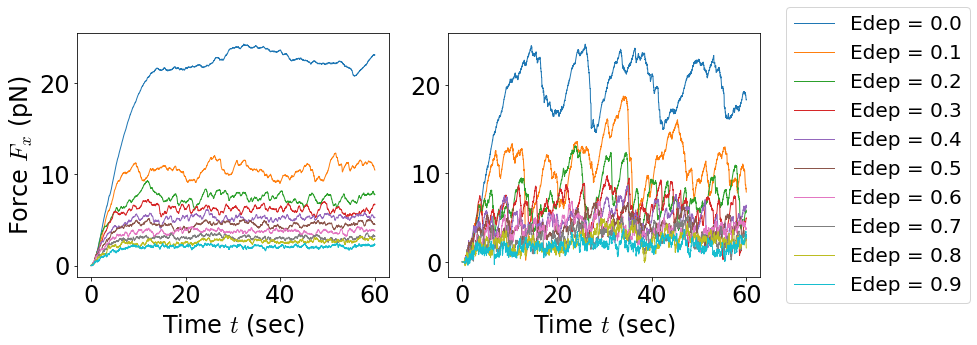

In [12]:
# High concentration energy-dependent zrl motors
dir_path = ot_ceph_path / '20-10-16_CG_OT_scan10.20_stat_rigid_zl-kin5_Edep0.0-1.0'
try:
    edep_dirs = (dir_path / 'simulations').glob('Edep0*')
    edep_dirs = sorted(edep_dirs, key=get_suff)
    fig, axarr = plt.subplots(1, 2, figsize=(14, 5))
    param_scan_force_plot(axarr, edep_dirs, "Edep")
    plt.tight_layout()
except:
    raise
finally:
    pass

# Crosslinker concentration plots

## Old non-constrained plots

Edep = 0.0, Edep = 0.2, Edep = 0.4, Edep = 0.6, Edep = 0.8,  


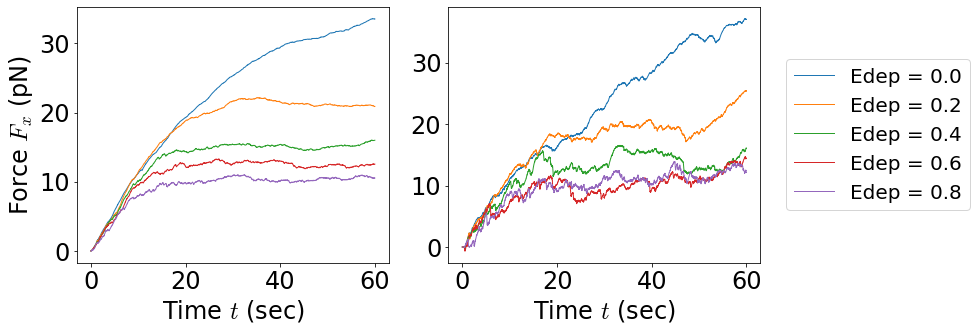

In [59]:
# Low concentration (c = .00001) energy-dependent nzrl motors and passive crosslinker
dir_path = ot_ceph_path / '20-10-06_CG_OT_scan5.16_stat_rigid_kin5_ase1_Edep0.0-1.0_both'
try:
    edep_dirs = (dir_path / 'simulations').glob('EdpK0*')
    edep_dirs = sorted(edep_dirs, key=get_suff)
    fig, axarr = plt.subplots(1, 2, figsize=(14, 5))
    param_scan_force_plot(axarr, edep_dirs, "Edep")
    plt.tight_layout()
except:
    raise
finally:
    pass

xlc = 2.5e-05
xlc = 5e-05
xlc = 7.5e-05
xlc = 0.0001


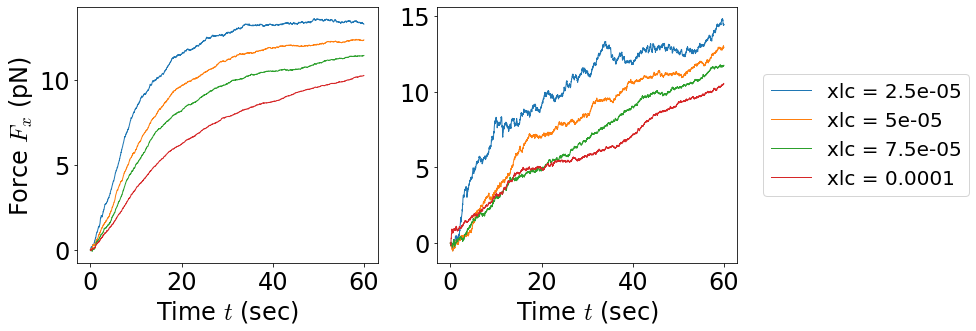

In [14]:
#Low concentration (c = .00001), energy-dependent (Edp = .5), nzrl motors and passive crosslinker scan
try:
    #edep_dirs = (dir_path / 'simulations').glob('Edep0*[!8-9]')
    dir_path = ot_ceph_path / '20-10-06_CG_OT_scan5.16_stat_rigid_kin5_ase1_Edep.5_xlc.0-.0001'
    edep_dirs = (dir_path / 'simulations').glob('xlc*')
    edep_dirs = sorted(edep_dirs, key=get_suff)
    fig, axarr = plt.subplots(1,2, figsize=(14,5))
    param_scan_force_plot(axarr, edep_dirs, "xlc")
    plt.tight_layout()
except:
    raise
finally:
    pass

xlc = 2.5e-05
xlc = 5e-05
xlc = 7.5e-05
xlc = 0.0001


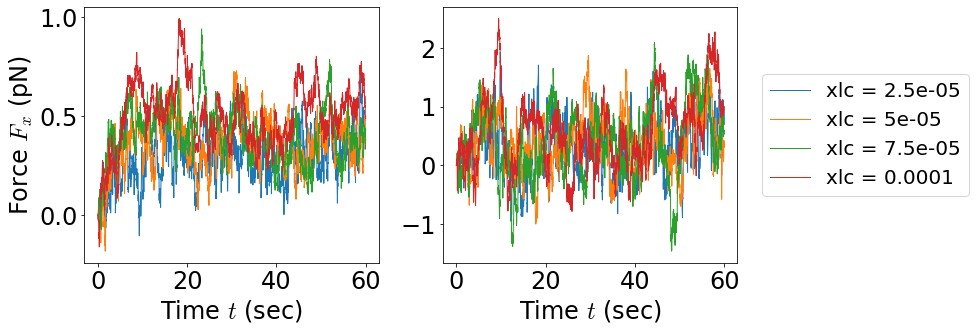

In [16]:
#Low concentration (c = .00001), energy-dependent (Edp = .5), zrl motors and passive crosslinker scan
try:
    #edep_dirs = (dir_path / 'simulations').glob('Edep0*[!8-9]')
    dir_path = ot_ceph_path / '20-10-16_CG_OT_scan5.16_stat_rigid_zl-kin5_Edep.5_xlc.00001-.0001'
    edep_dirs = (dir_path / 'simulations').glob('xlc*')
    edep_dirs = sorted(edep_dirs, key=get_suff)
    fig, axarr = plt.subplots(1,2, figsize=(14,5))
    param_scan_force_plot(axarr, edep_dirs, "xlc")
    plt.tight_layout()
except:
    raise
finally:
    pass

xlc = 2.5e-05
xlc = 5e-05
xlc = 7.5e-05
xlc = 0.0001


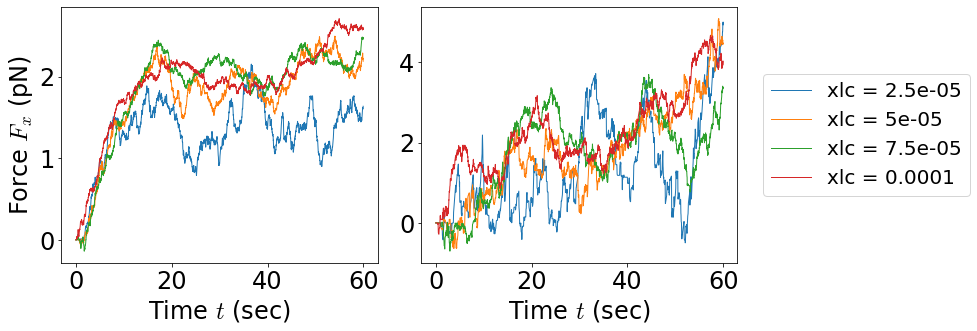

In [17]:
#Low concentration (c = .00001), energy-dependence (Edp = .0), zrl motors and passive crosslinker scan
dir_path = ot_ceph_path / '20-10-16_CG_OT_scan5.16_stat_rigid_zl-kin5_Edep0_xlc.00001-.0001'
try:
    #edep_dirs = (dir_path / 'simulations').glob('Edep0*[!8-9]')
    
    edep_dirs = (dir_path / 'simulations').glob('xlc*')
    edep_dirs = sorted(edep_dirs, key=get_suff)
    fig, axarr = plt.subplots(1,2, figsize=(14,5))
    param_scan_force_plot(axarr, edep_dirs, "xlc")
    plt.tight_layout()
except:
    raise
finally:
    pass

xlc = 0.0
xlc = 0.0001


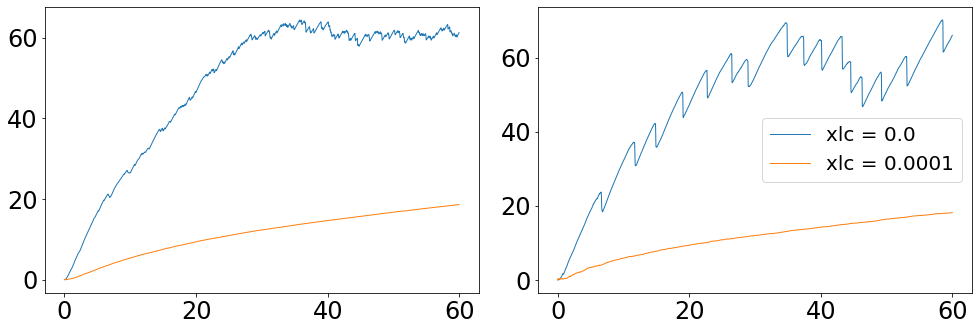

In [18]:
#Low concentration (c = .0001), energy-dependence (Edp = .0), zrl motors and passive crosslinker scan
dir_path = ot_ceph_path / '21-05-14_CG_OT_scan8.12_stat_kin5_ase1_Edep.5_5um'
try:
    edep_dirs = (dir_path / 'simulations').glob('xlc*')
    edep_dirs = sorted(edep_dirs, key=get_suff)
    fig, axarr = plt.subplots(1,2, figsize=(14,5))
    try:
        param_scan_force_plot(axarr, edep_dirs, "xlc")
    except:
        pass
    axarr[1].legend()
    plt.tight_layout()
except:
    raise
finally:
    pass

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


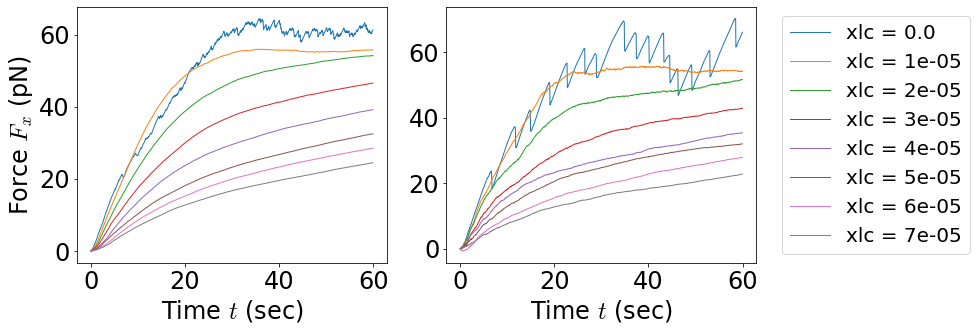

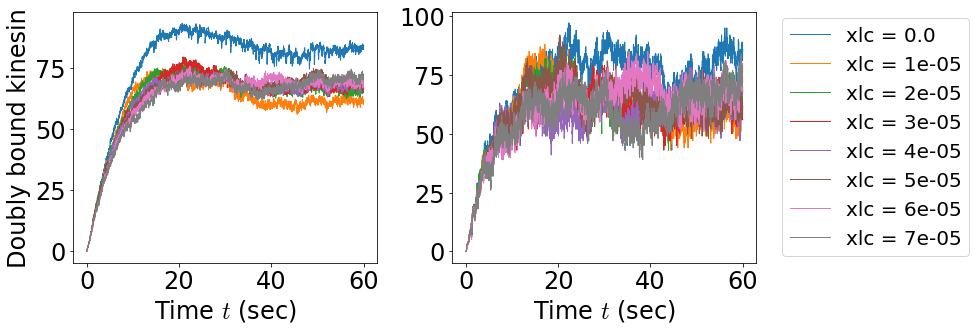

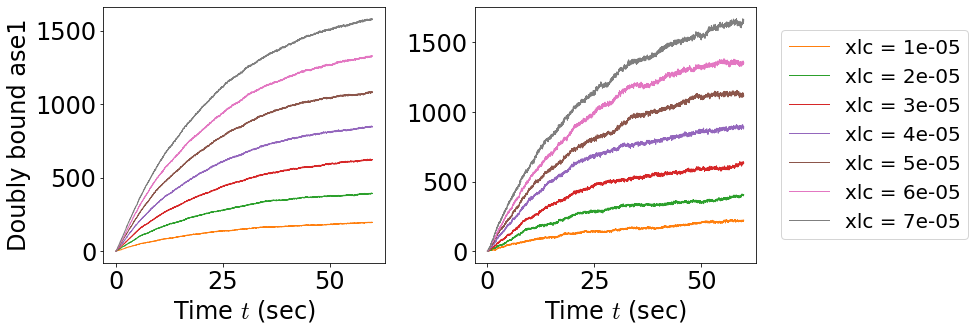

In [43]:
dir_path = ot_ceph_path / '21-05-26_CG_OT_scan8.12_stat_kin5_ase1_Edep.5_5um_conc1e-5'
try: 
    edep_dirs = (dir_path / 'simulations').glob('xlc*')
    edep_dirs = sorted(edep_dirs, key=get_suff)
    fig, axarr = plt.subplots(1,2, figsize=(14,5))
    try:
        param_scan_force_plot(axarr, edep_dirs, "xlc")
    except:
        pass
    fig.tight_layout()
    
    fig1, axarr1 = plt.subplots(1,2, figsize=(14,5))
    try:
        param_scan_xlink_num_plot(axarr1, edep_dirs, "xlc")
    except:
        pass
    fig1.tight_layout()
    
    fig2, axarr2 = plt.subplots(1,2, figsize=(14,5))
    try:
        param_scan_xlink_num_plot(axarr2, edep_dirs, "xlc", species='ase1')
    except:
        raise
    fig2.tight_layout()
except:
    raise
finally:
    pass

## Constrained motion plots

xlc = 0.0, xlc = 0.2, xlc = 0.4, xlc = 0.6, xlc = 0.8,  
xlc = 0.0, xlc = 0.2, xlc = 0.4, xlc = 0.6, xlc = 0.8,  
xlc = 0.0, xlc = 0.2, xlc = 0.4, xlc = 0.6, xlc = 0.8,  


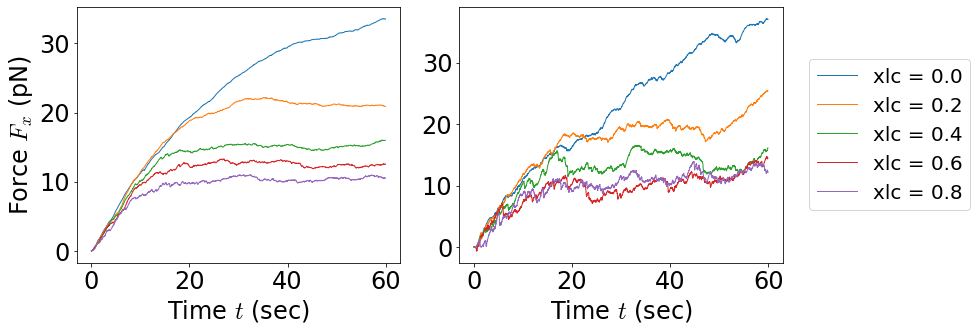

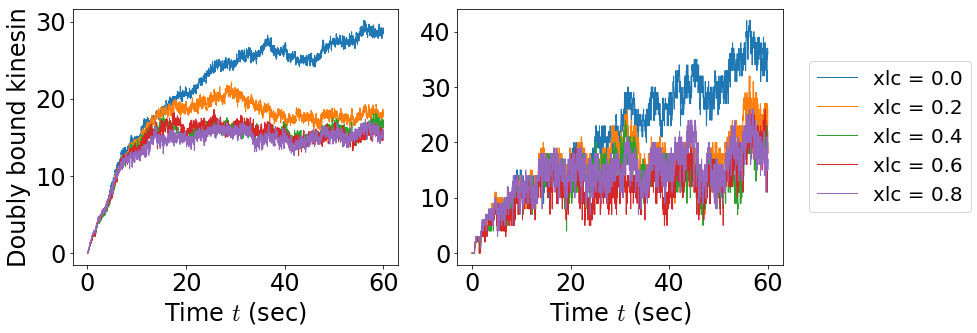

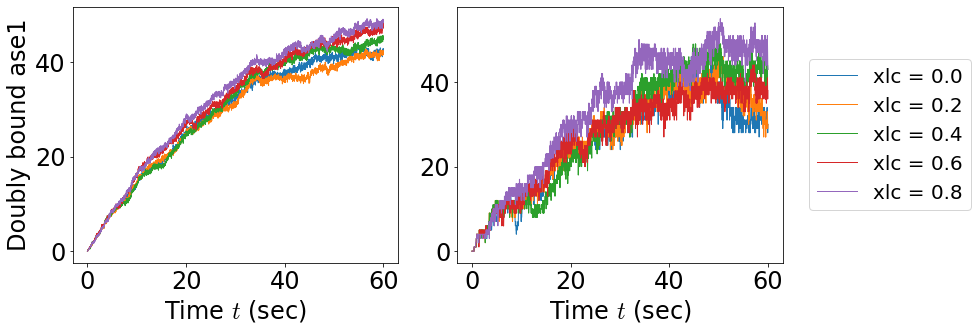

In [62]:
dir_path = ot_ceph_path / '21-06-04_CG_OT_scan8.12_stat_kin5_ase1_Edep.5_5um_conc1e-5_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


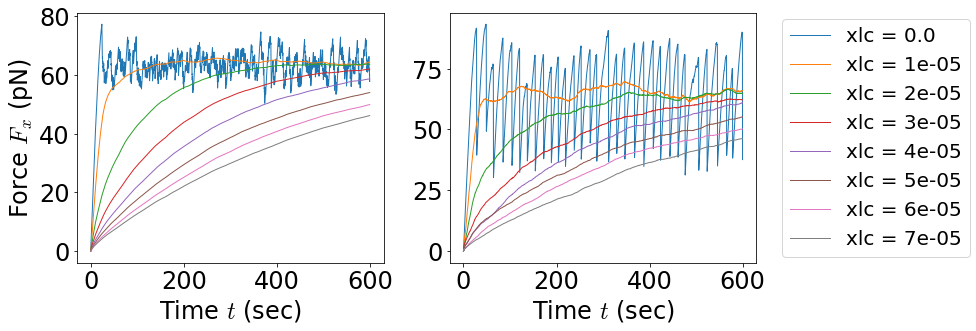

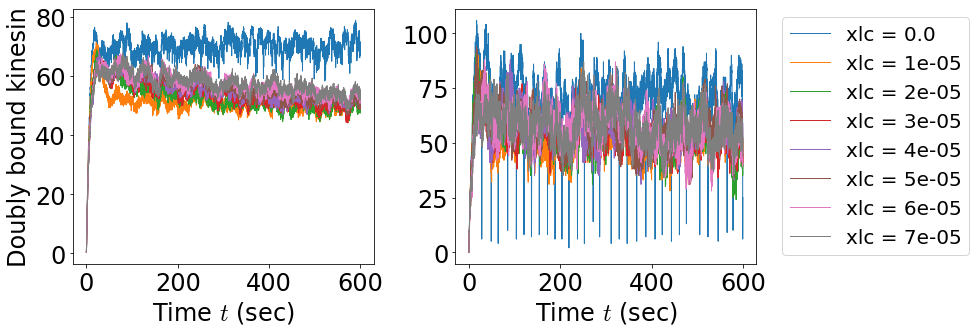

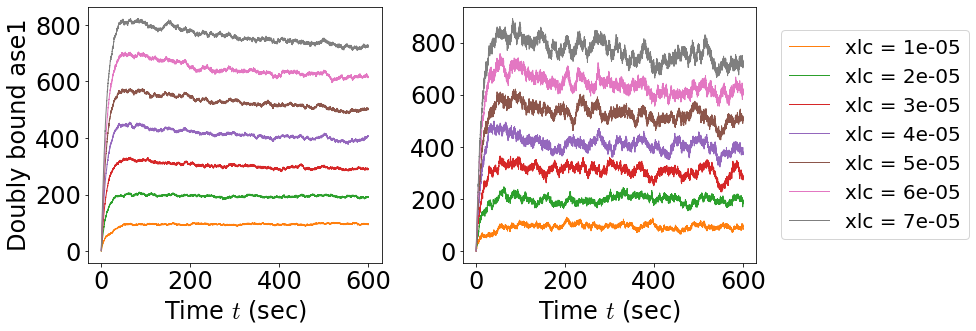

In [24]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-5_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


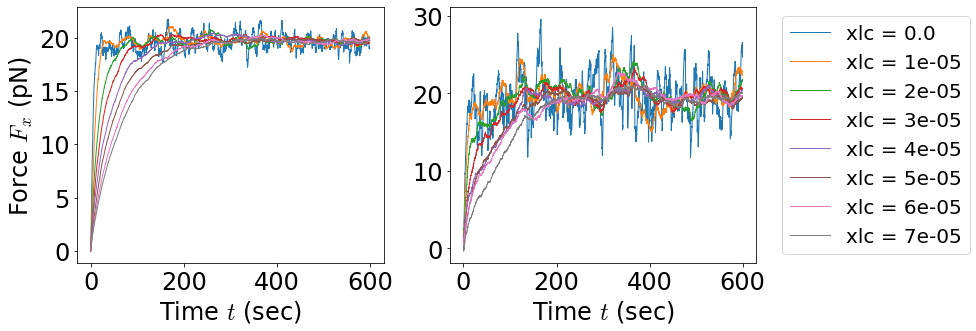

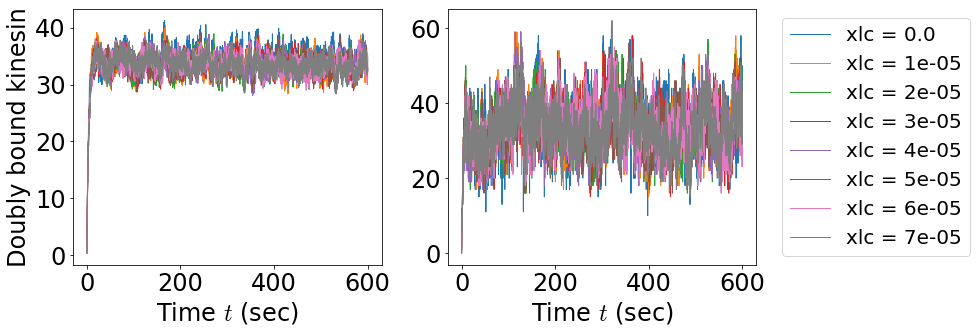

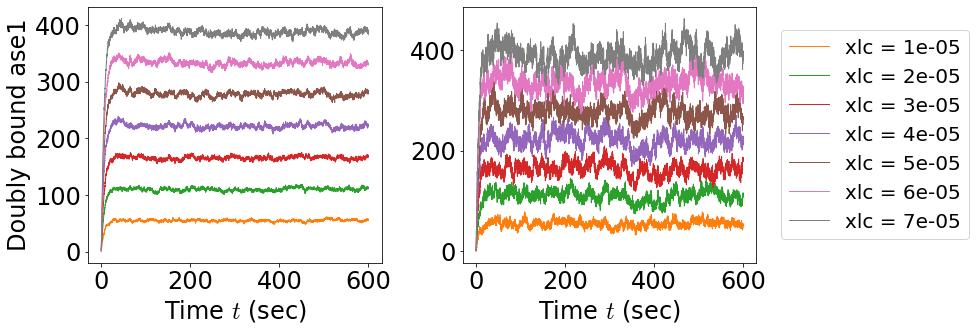

In [25]:
dir_path = ot_path / '21-06-10_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-5_eqL1.0_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


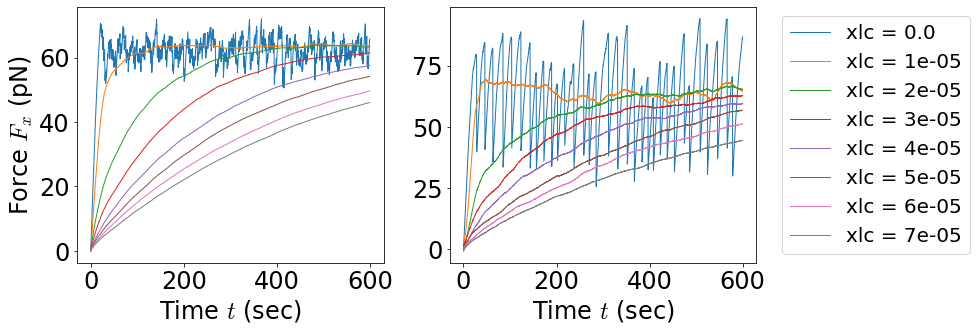

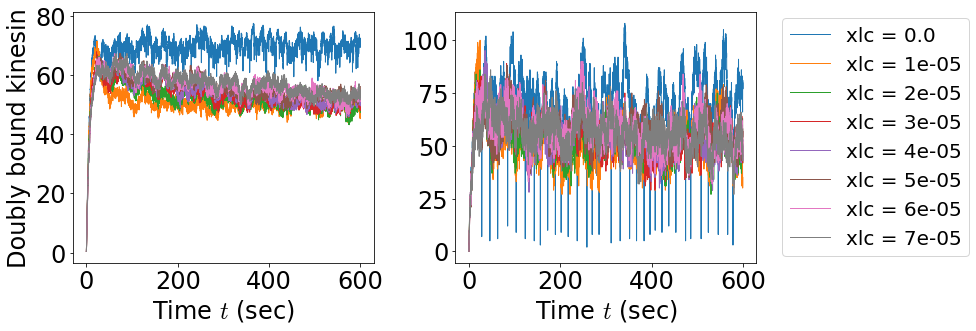

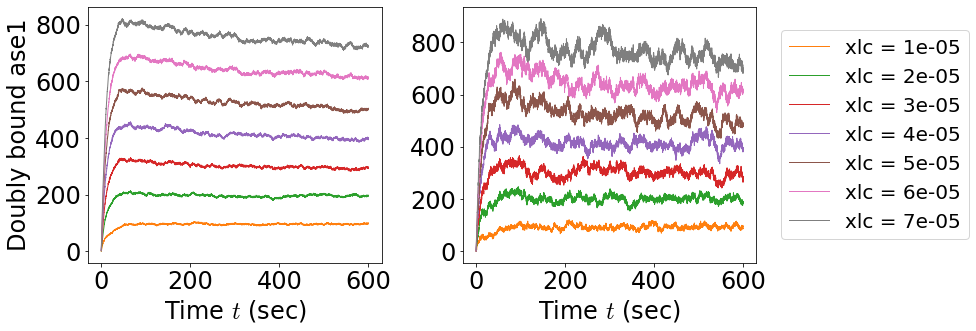

In [26]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-5_BrM_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


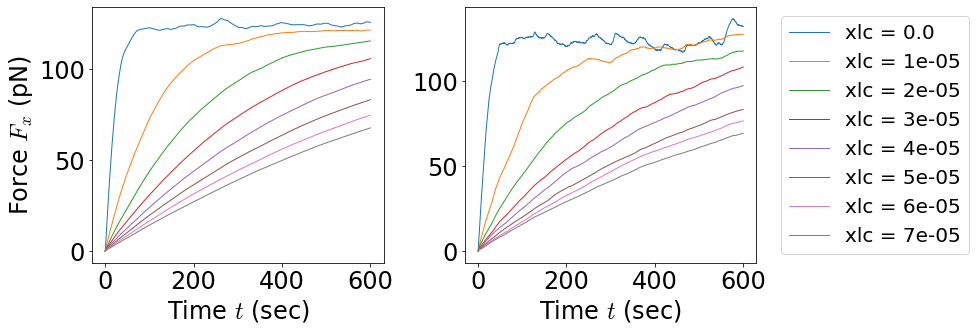

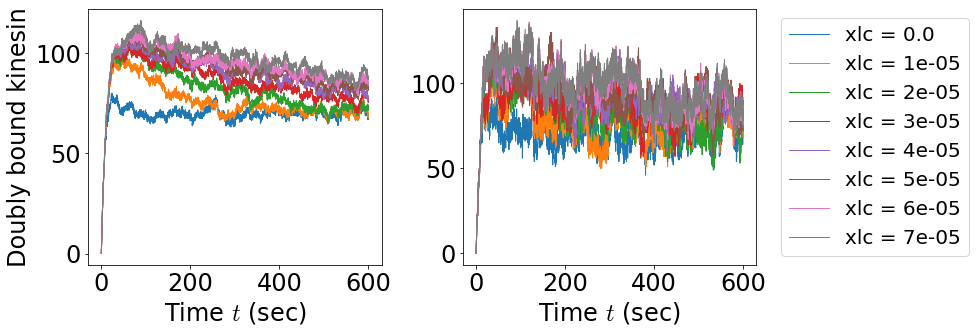

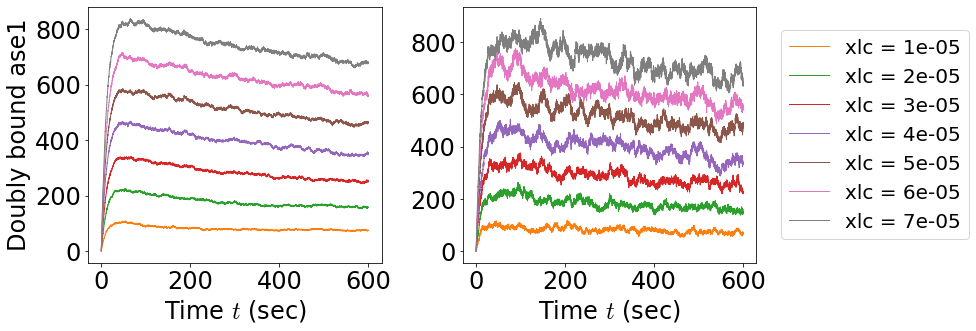

In [44]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep0_5um_conc1e-5_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


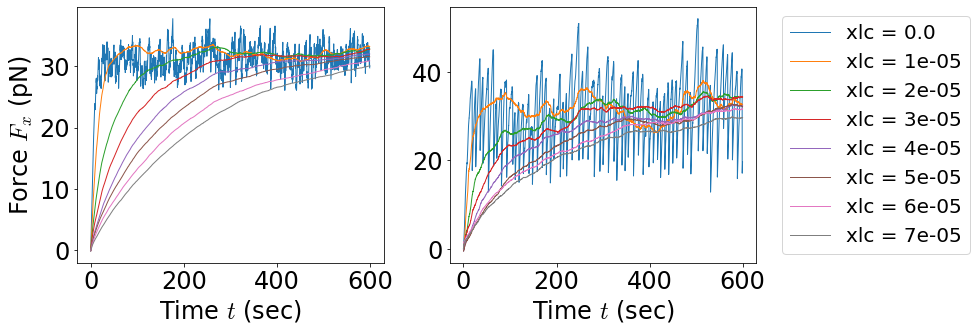

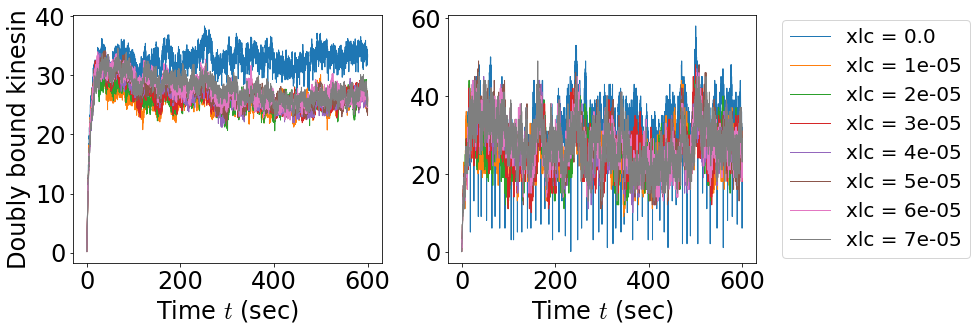

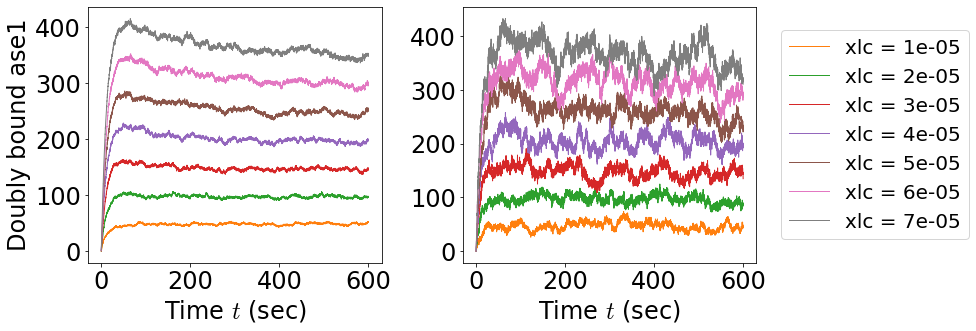

In [28]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_2.5um_conc1e-5_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


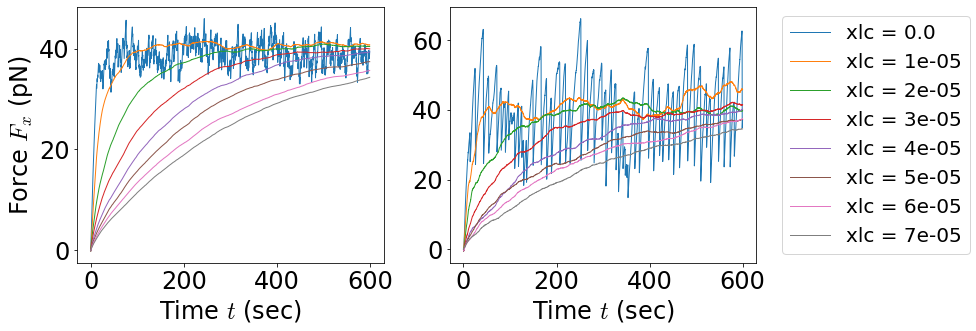

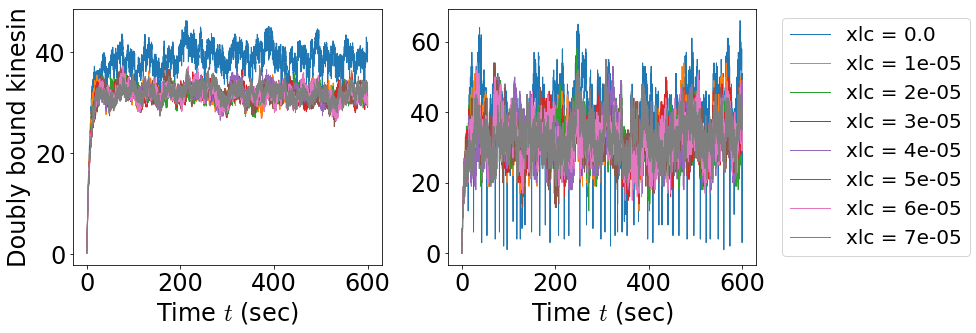

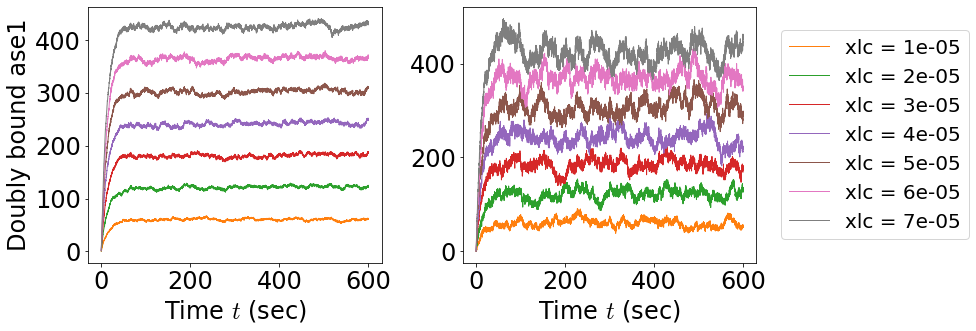

In [29]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_2.5umFixed_conc1e-5_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


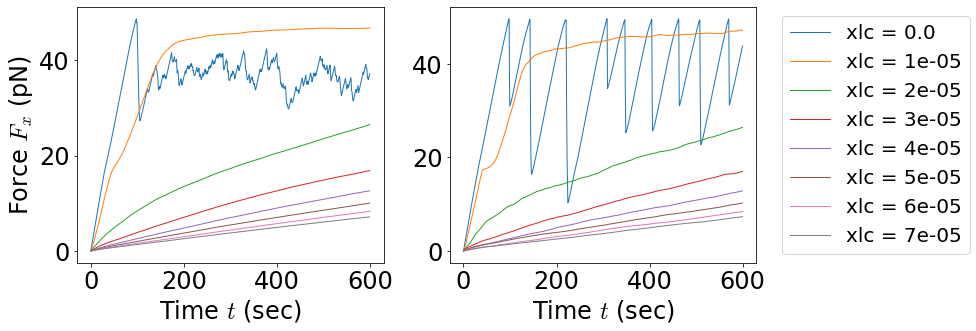

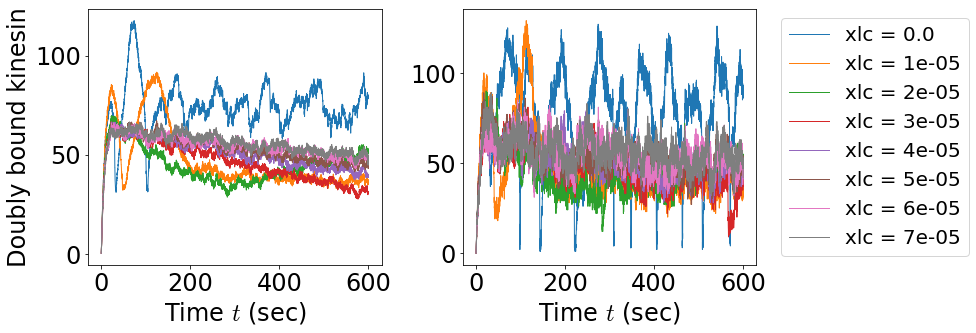

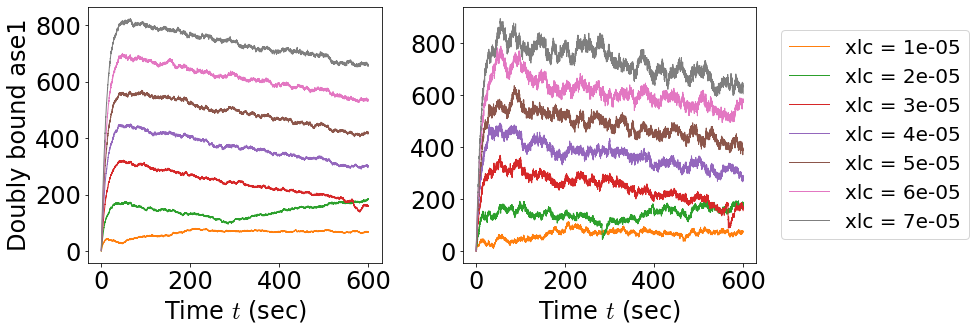

In [30]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-5_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


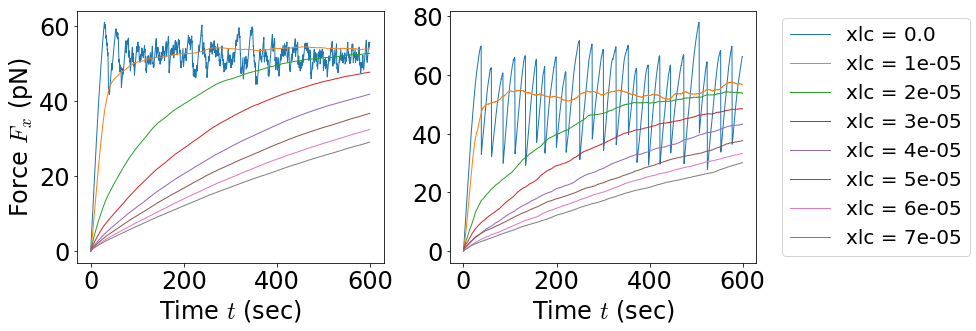

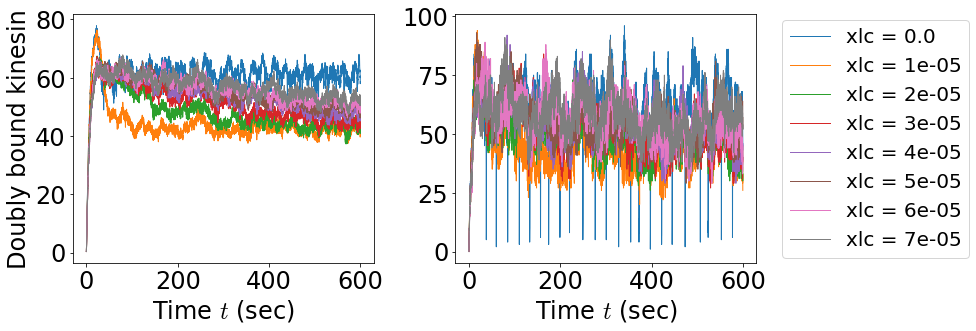

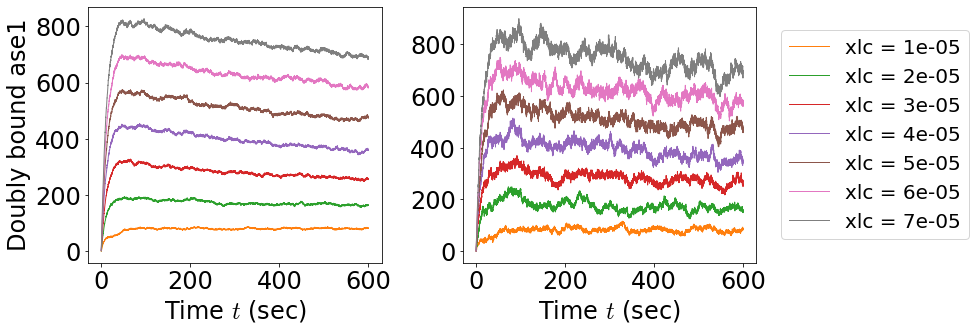

In [31]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-5_ok5_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


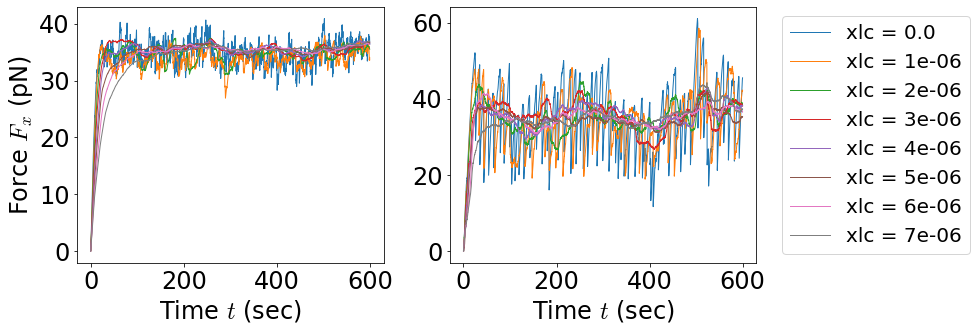

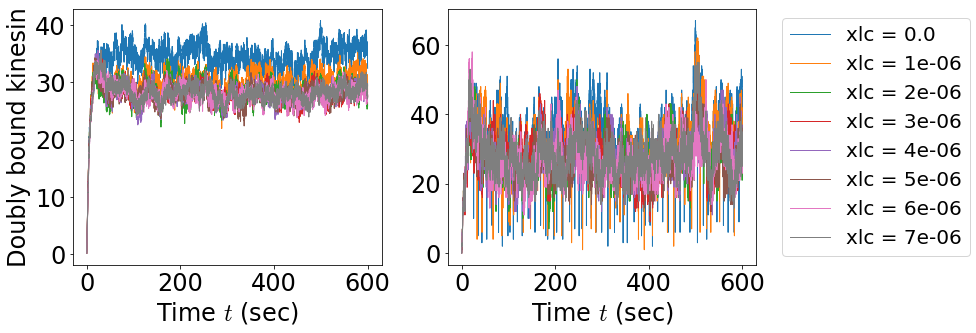

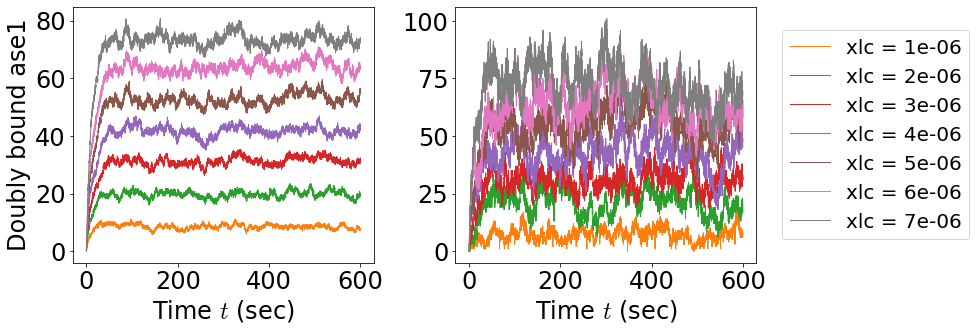

In [32]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-6_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


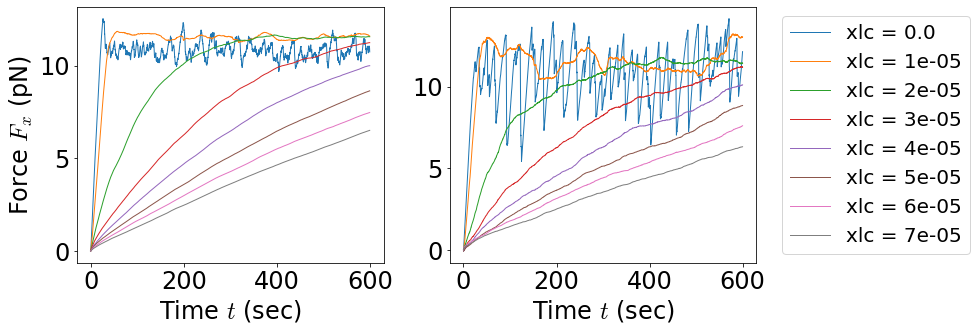

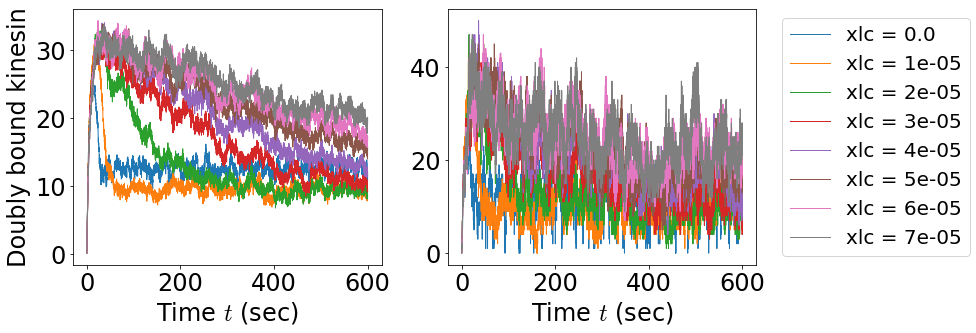

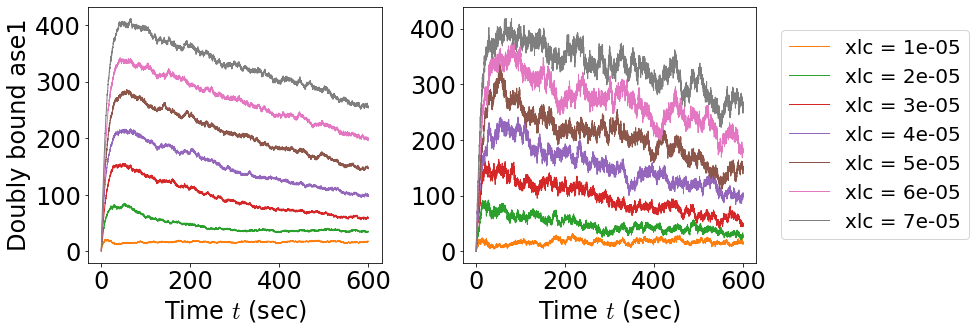

In [33]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_2.5um_conc1e-5_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


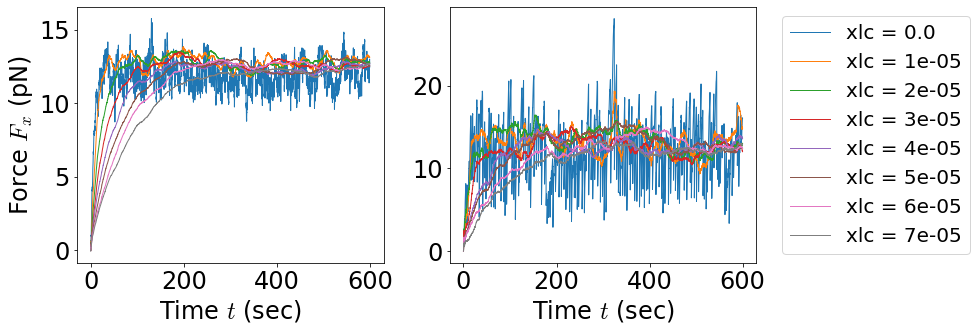

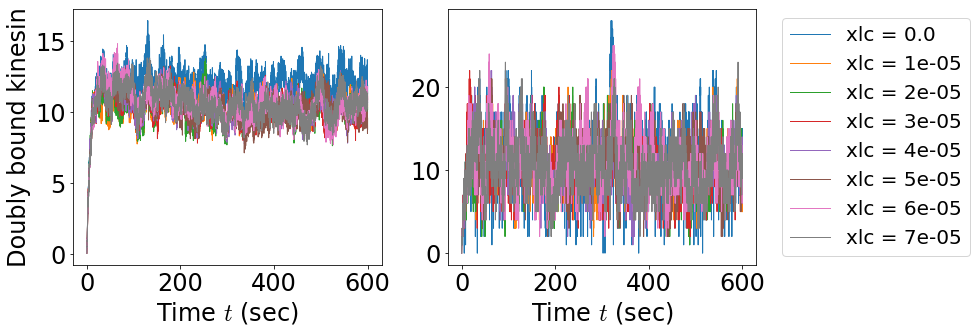

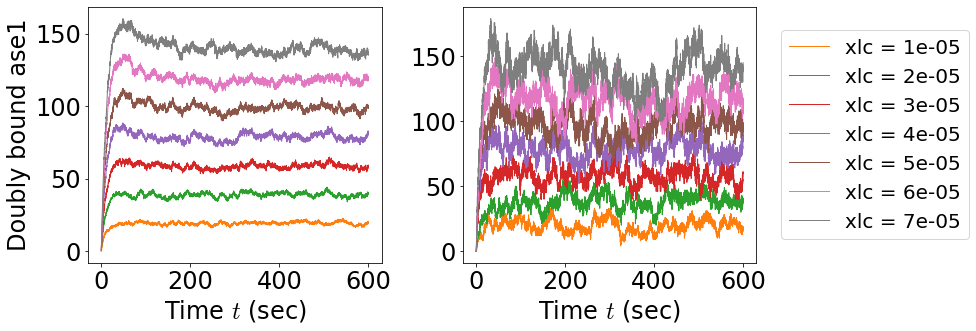

In [34]:
dir_path = ot_path / '21-06-09_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_1um_conc1e-5_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


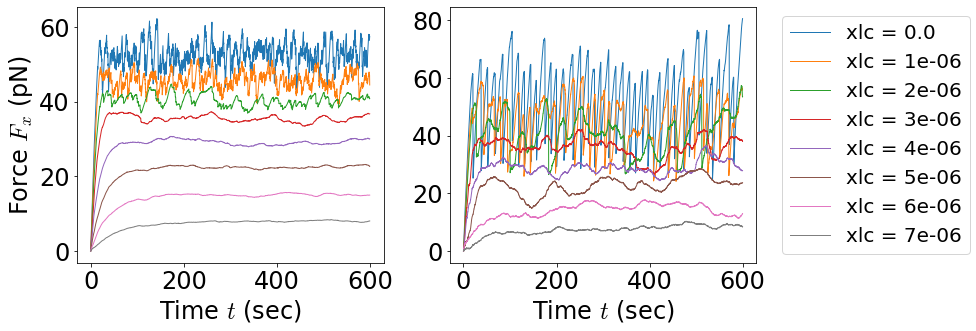

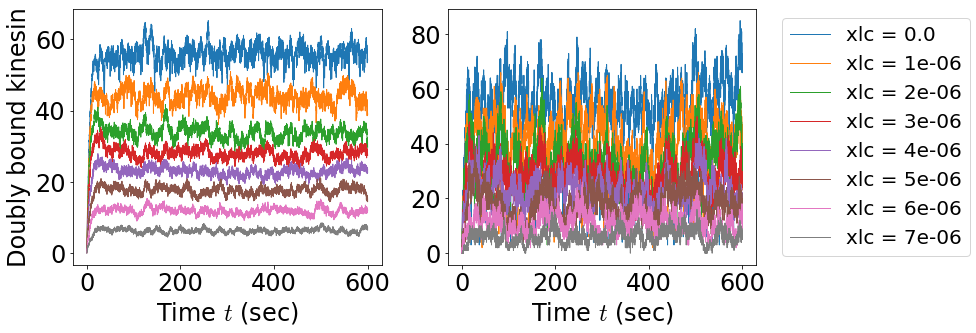

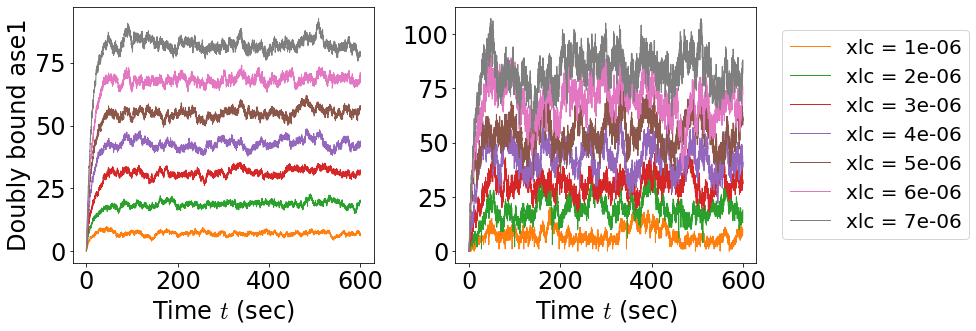

In [46]:
dir_path = ot_ceph_path / '21-06-08_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_constC1e-5_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

## Soft optical trap graphs

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  
xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


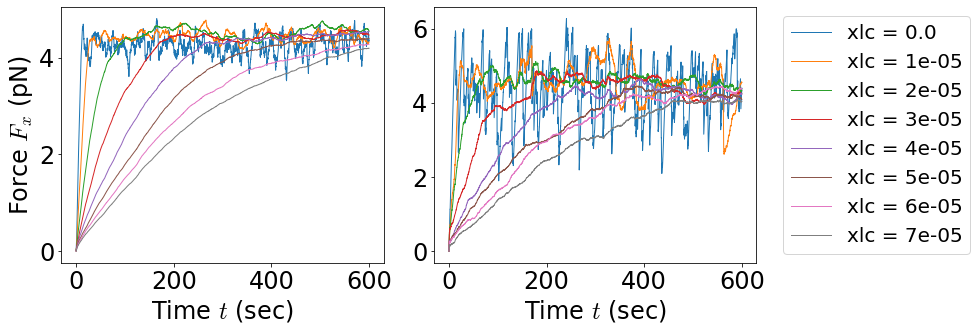

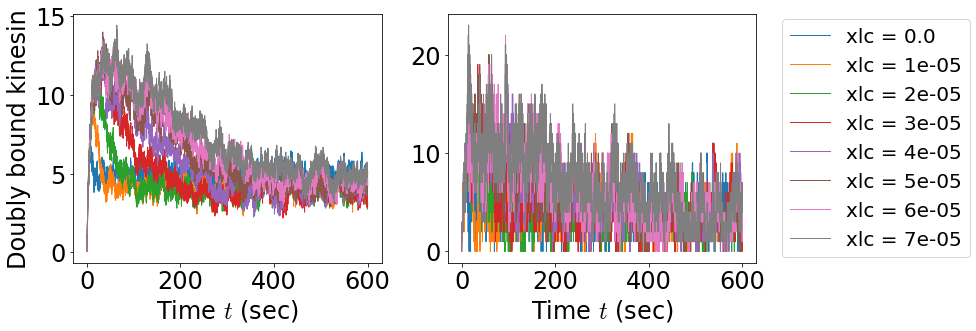

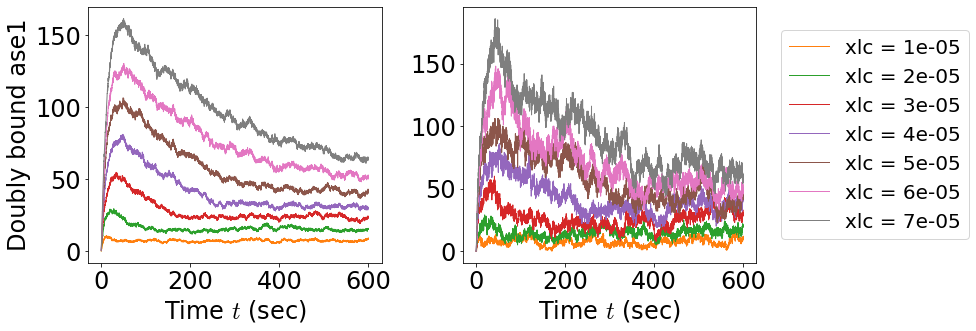

In [37]:
dir_path = ot_ceph_path / '21-06-09_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_1um_conc1e-5_ot1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


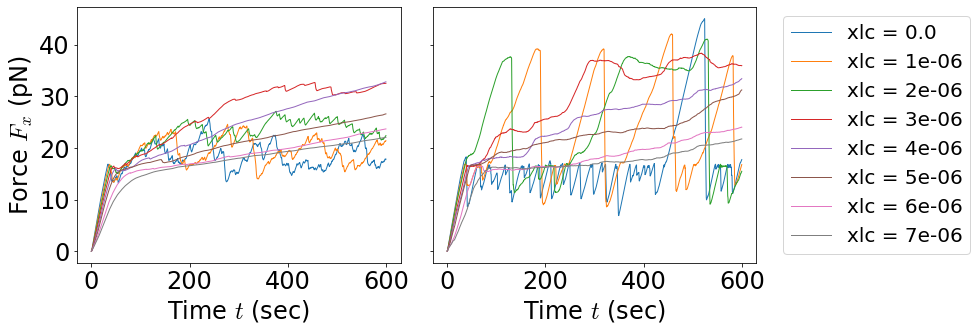

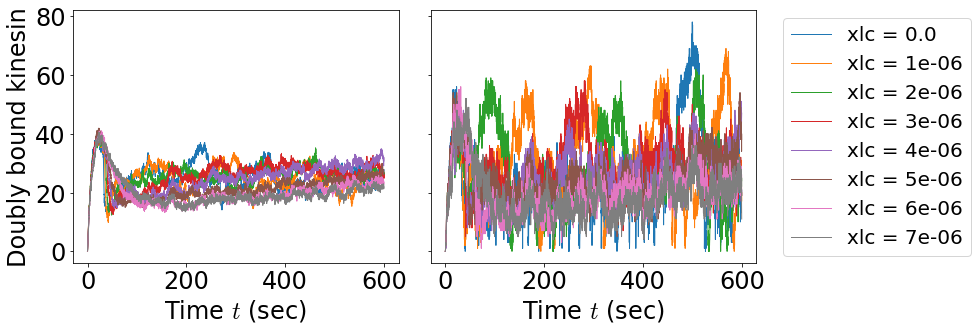

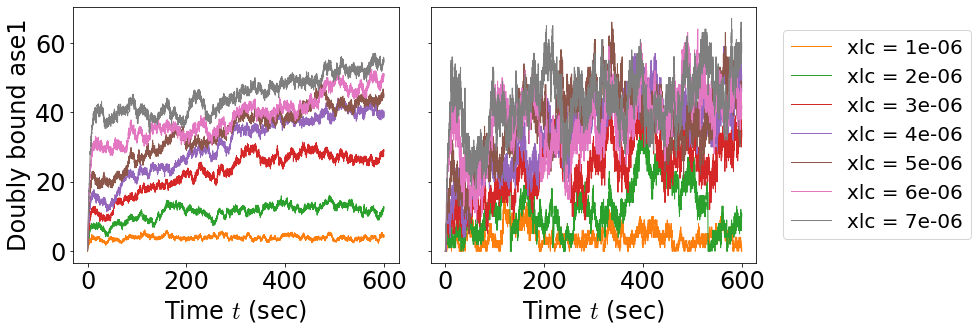

In [19]:
dir_path = ot_ceph_path / '21-06-09_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


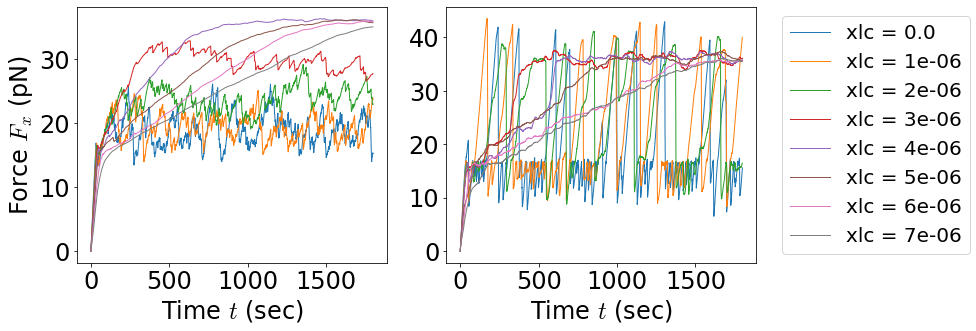

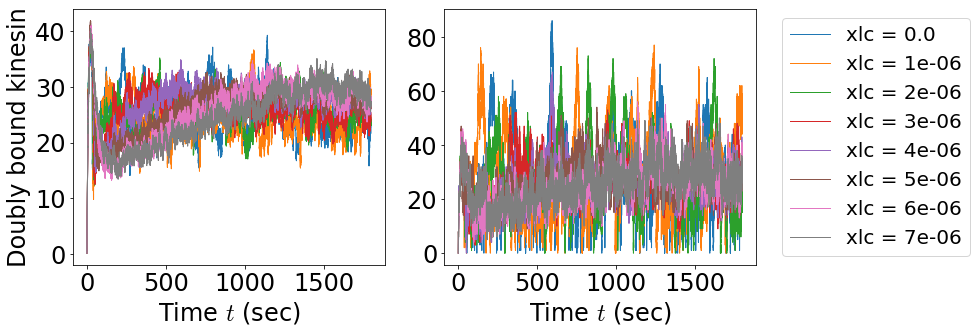

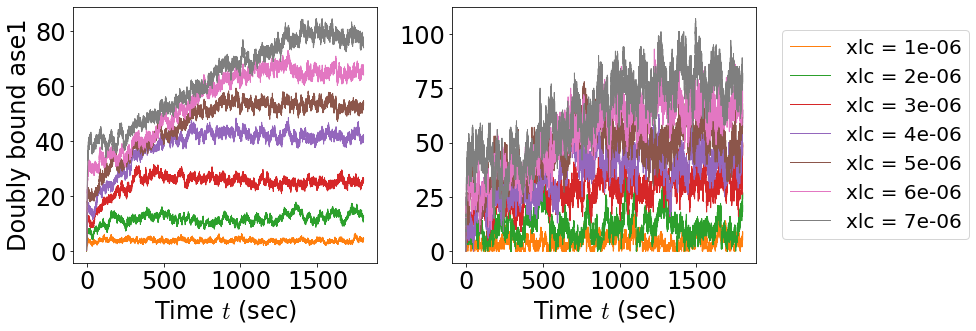

In [39]:
dir_path = ot_ceph_path / '21-06-09_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-6_ok1_cstr_long'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


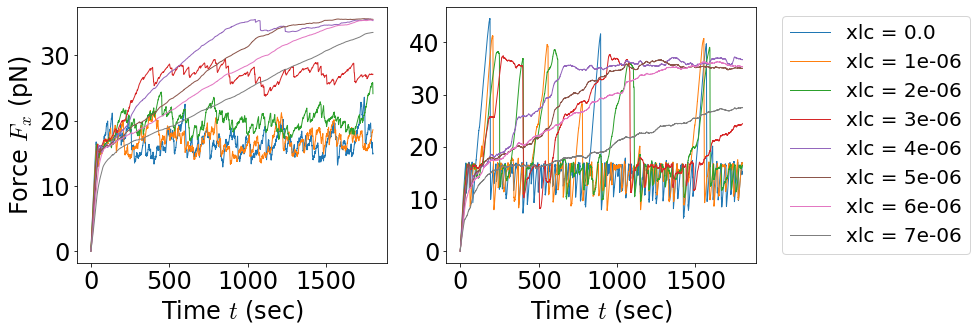

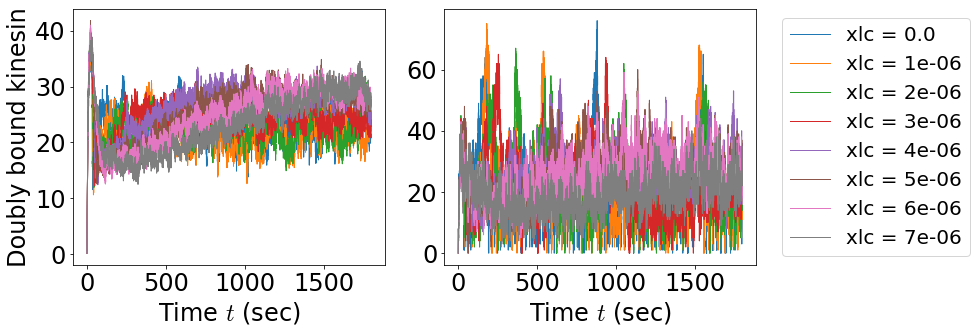

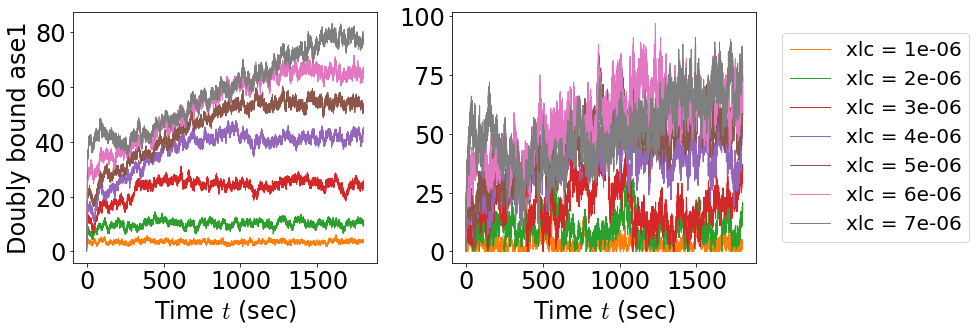

In [40]:
dir_path = ot_ceph_path / '21-06-11_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-6_ok1_BrM_cstr_long'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


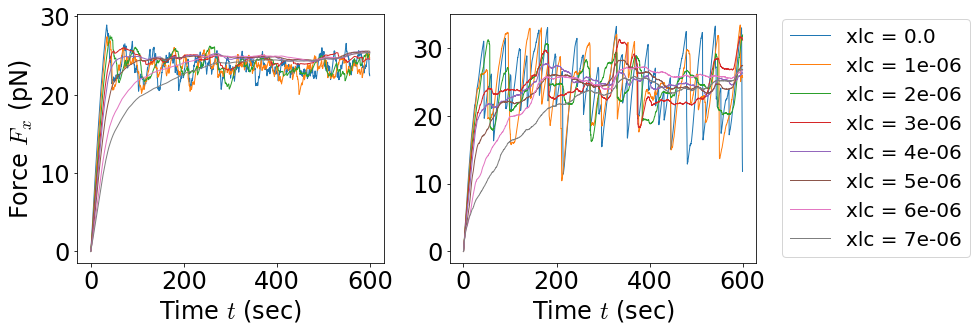

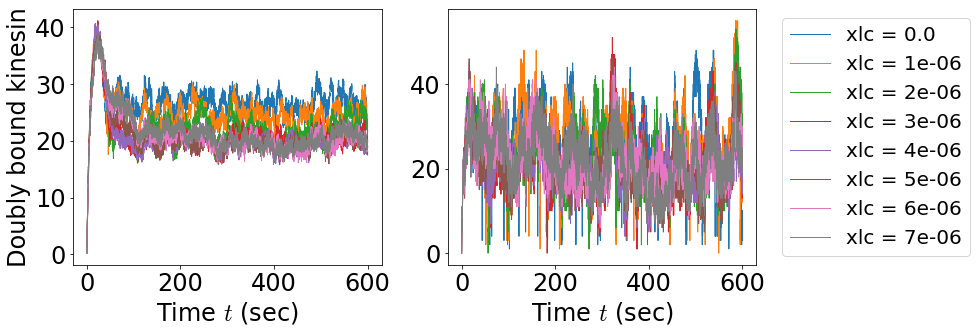

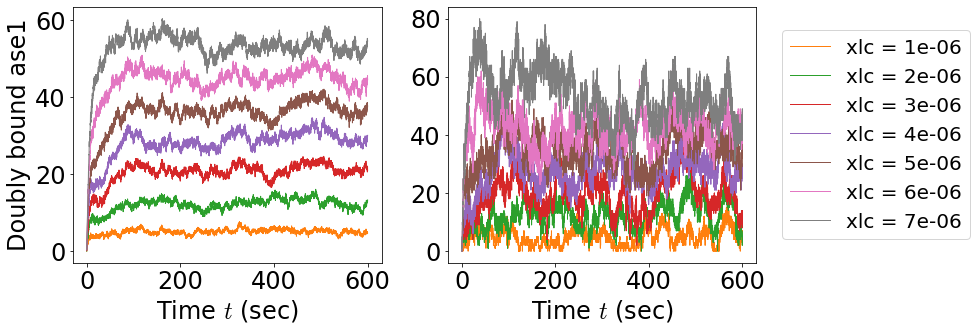

In [41]:
dir_path = ot_ceph_path / '21-06-09_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-6_ok2_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


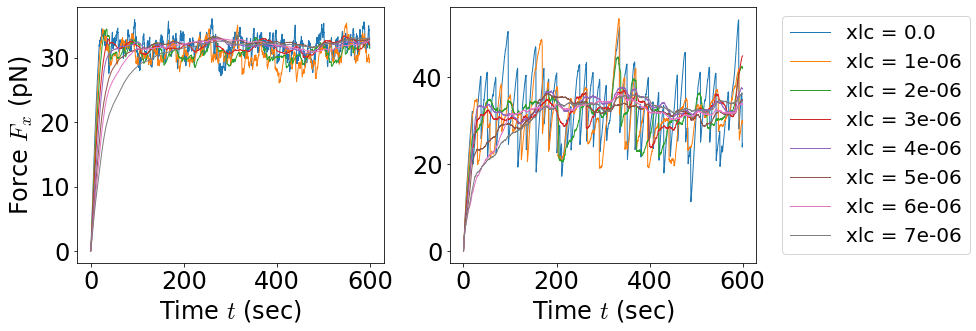

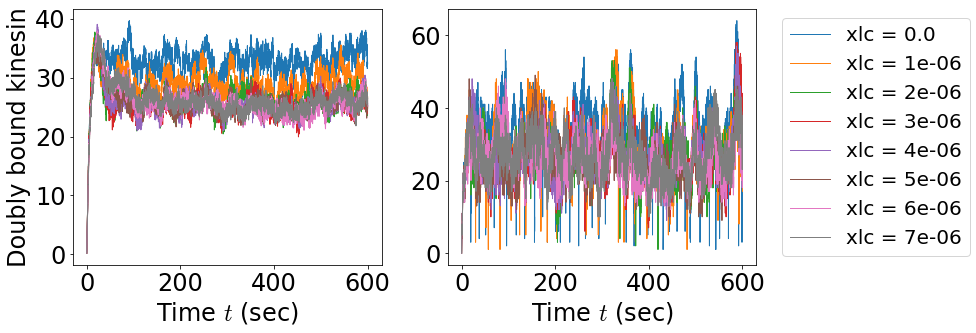

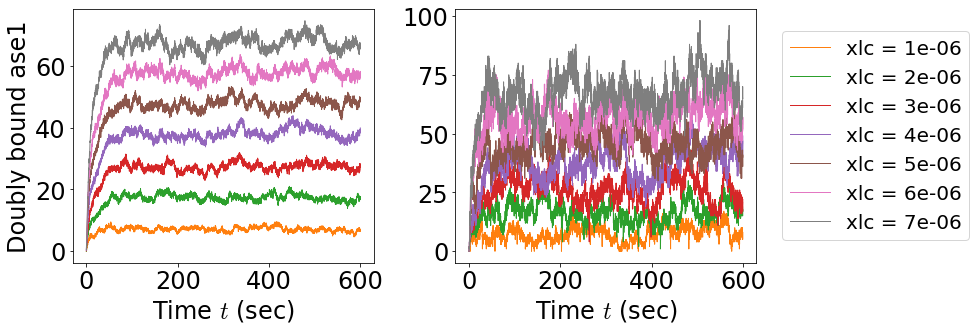

In [42]:
dir_path = ot_ceph_path / '21-06-09_CG_OT_scan8.16_stat_kin5_ase1_Edep.5_5um_conc1e-6_ok5_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


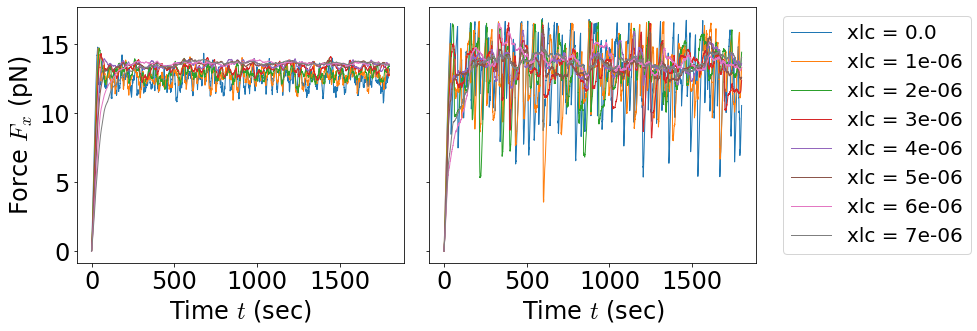

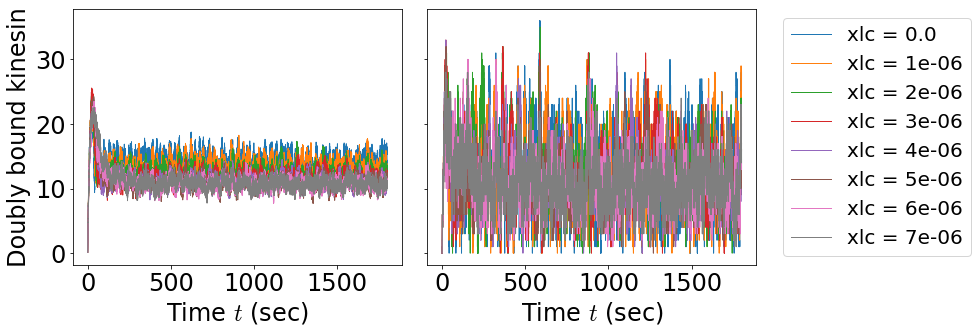

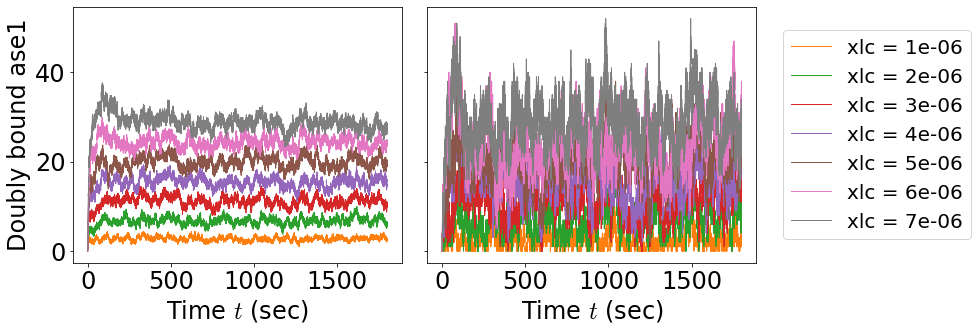

In [19]:
dir_path = ot_path / '21-07-06_CG_OT_scan8.16_stat_kin5_ase1_5um_2.5umFixed_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


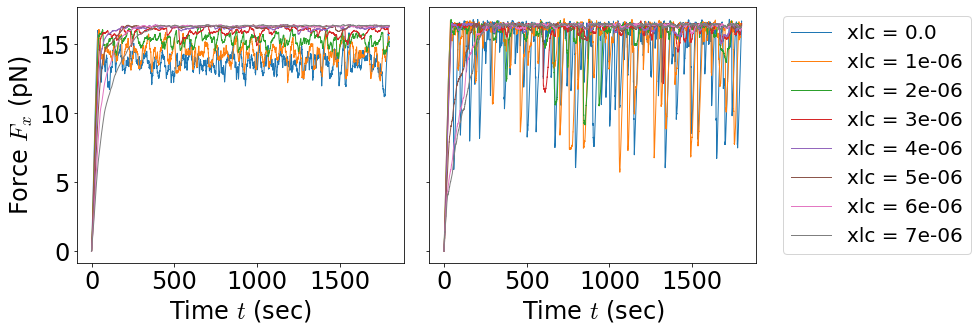

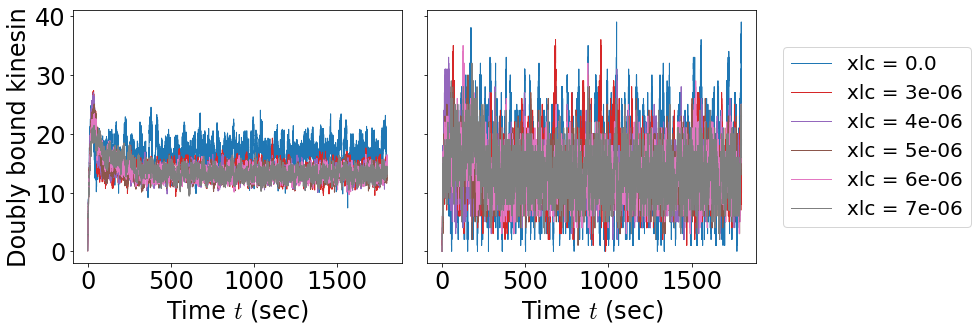

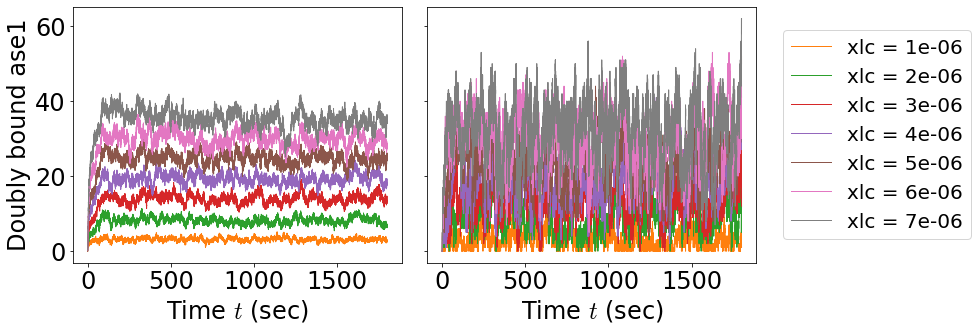

In [41]:
dir_path = ot_path / '21-07-07_CG_OT_scan8.16_stat_kin5_ase1_2.5umFixedshift_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-05, xlc = 2e-05, xlc = 3e-05, xlc = 4e-05, xlc = 5e-05, xlc = 6e-05, xlc = 7e-05,  


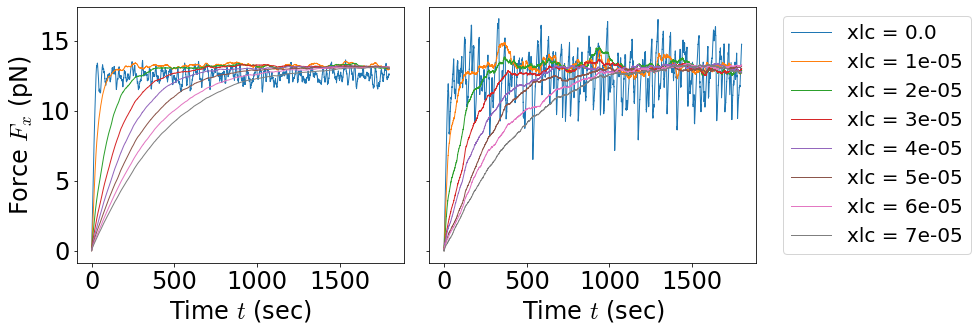

In [22]:
dir_path = ot_path / '21-07-06_CG_OT_scan8.16_stat_kin5_ase1_5um_conc1e-5_eqL1_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


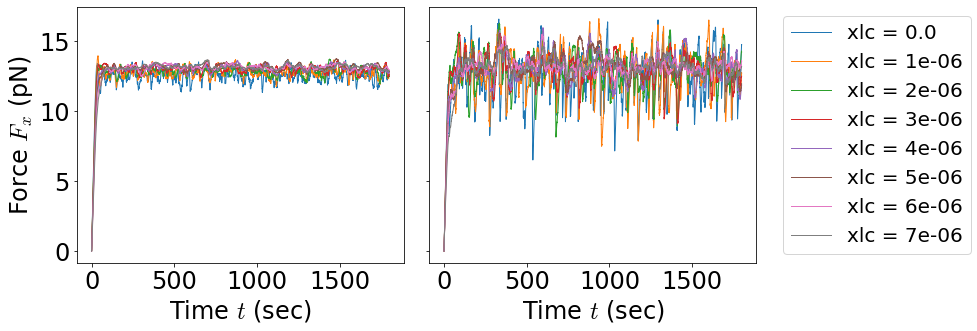

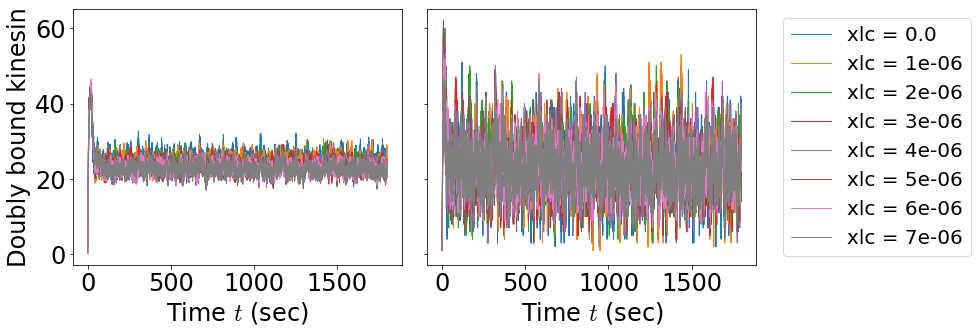

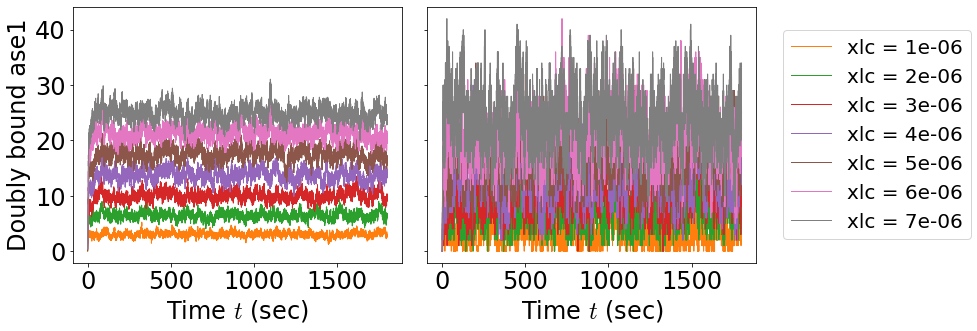

In [34]:
dir_path = ot_path / '21-07-07_CG_OT_scan8.16_stat_kin5_ase1_eqL1.0_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


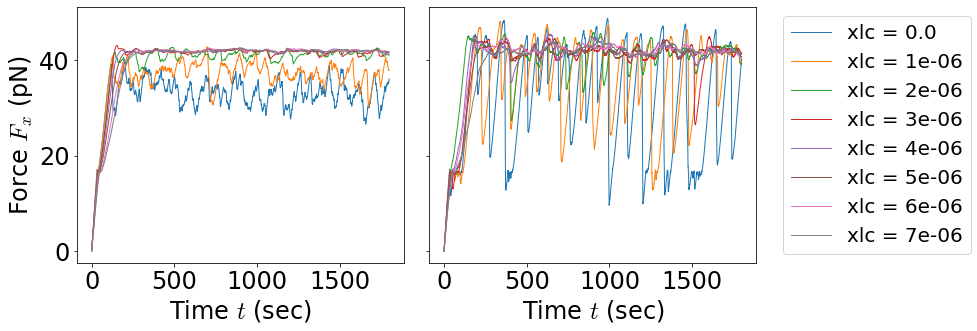

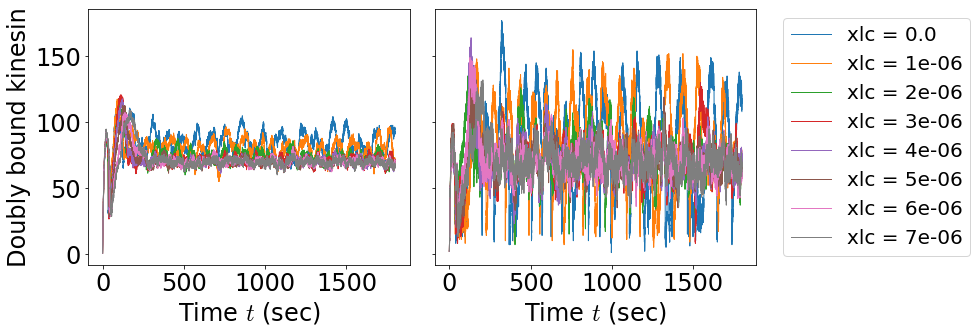

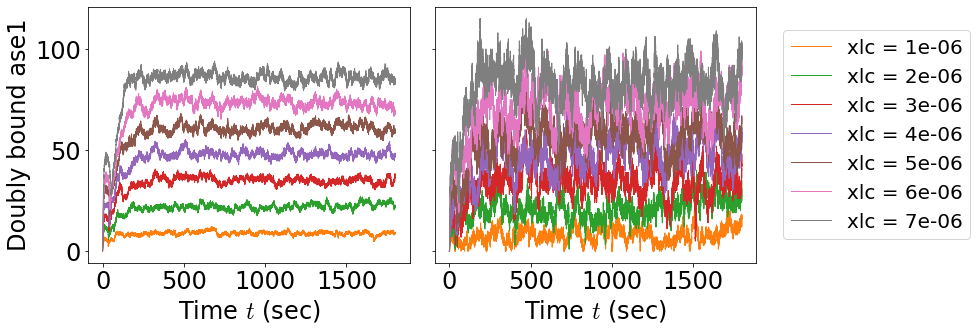

In [35]:
dir_path = ot_path / '21-07-07_CG_OT_scan8.16_stat_kin5_ase1_eqL1.2_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


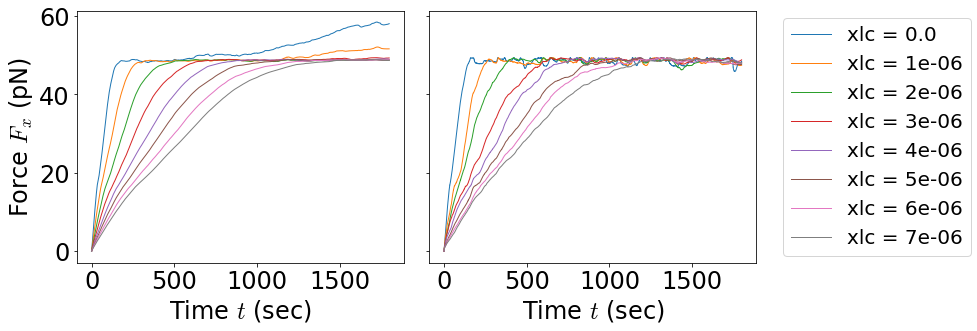

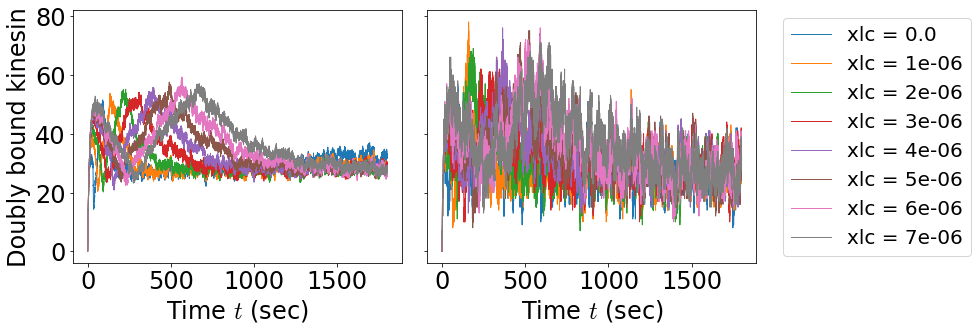

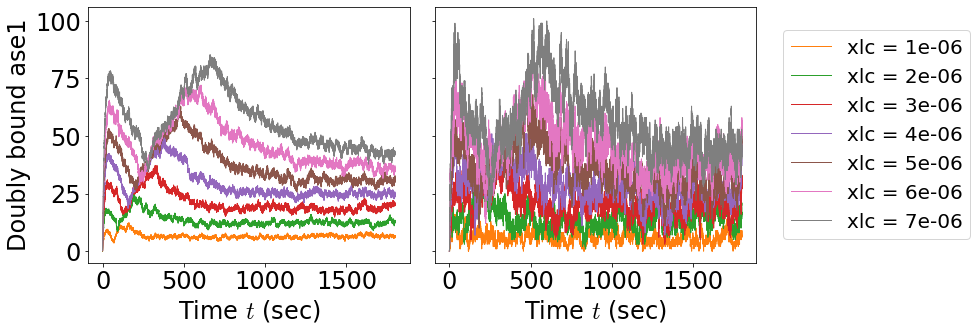

In [36]:
dir_path = ot_path / '21-07-06_CG_OT_scan8.16_stat_kin5_ase1_5um_Edep0_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


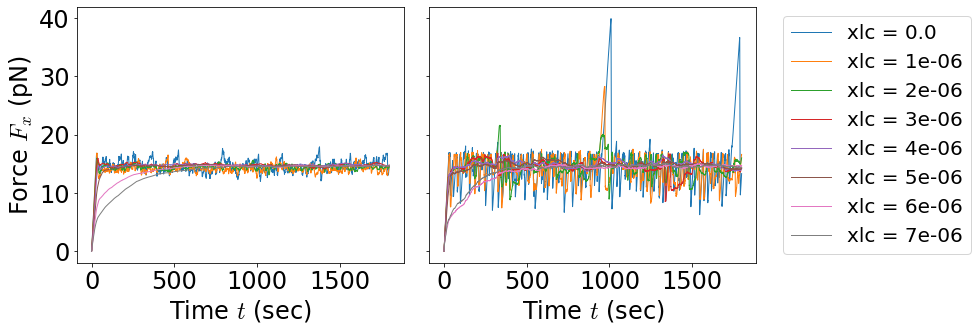

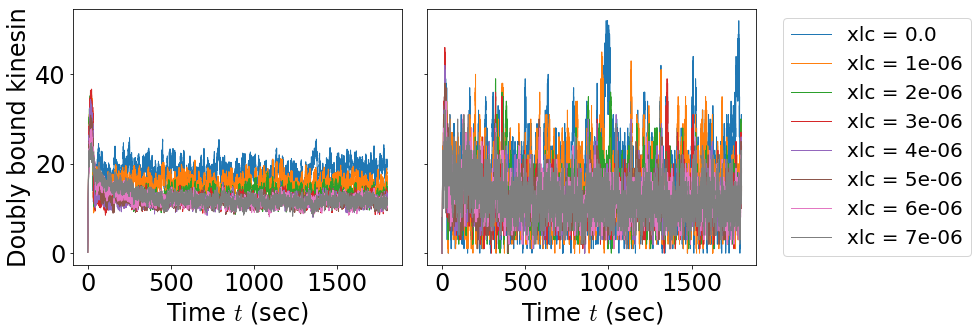

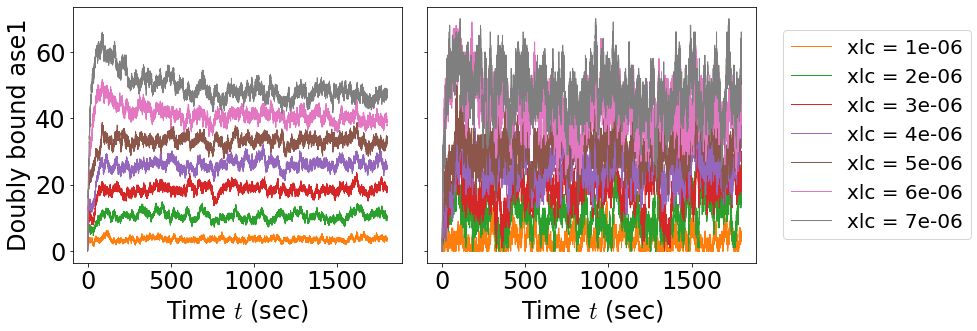

In [37]:
dir_path = ot_path / '21-07-06_CG_OT_scan8.16_stat_kin5_ase1_5um_fs25_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


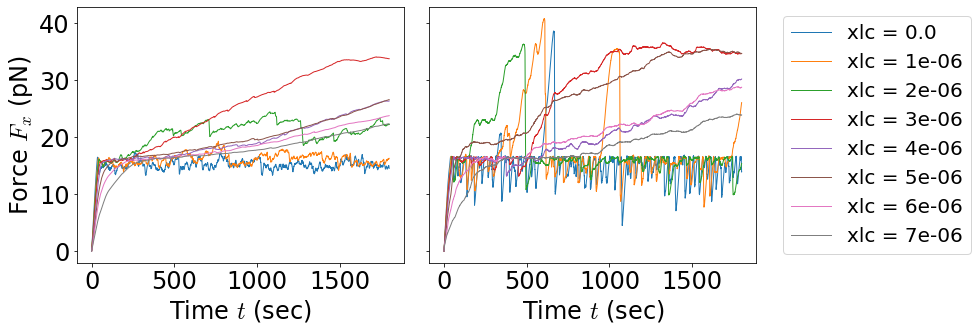

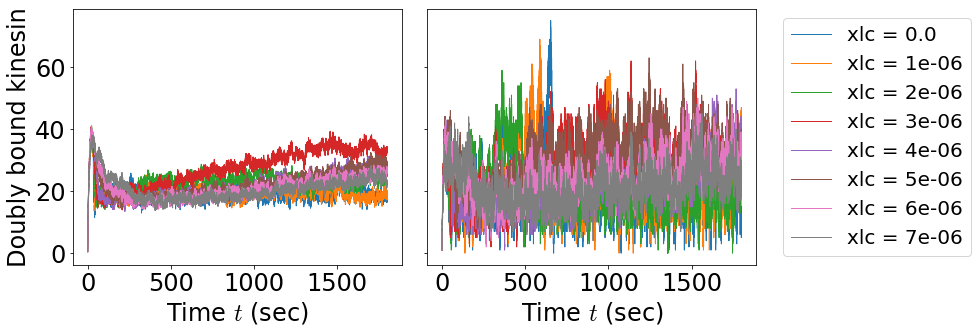

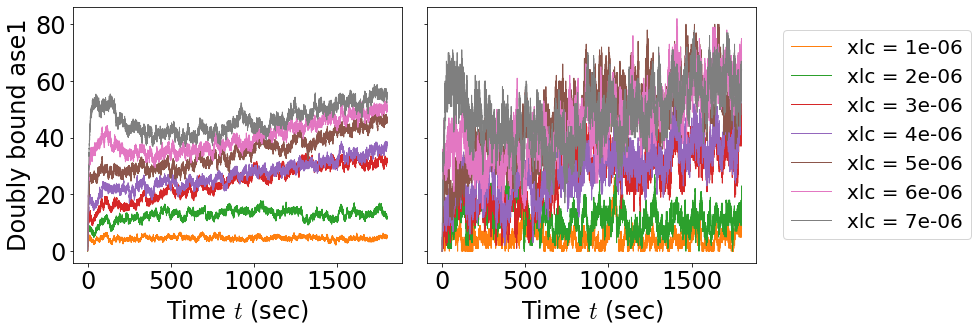

In [38]:
dir_path = ot_path / '21-07-06_CG_OT_scan8.16_stat_kin5_ase1_5um_KkoD.055_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


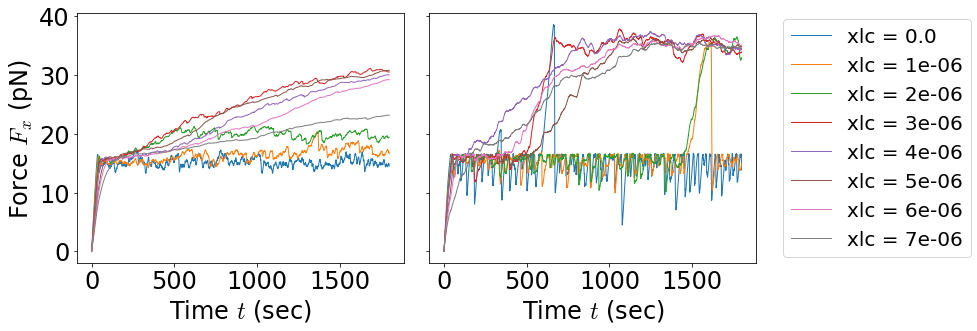

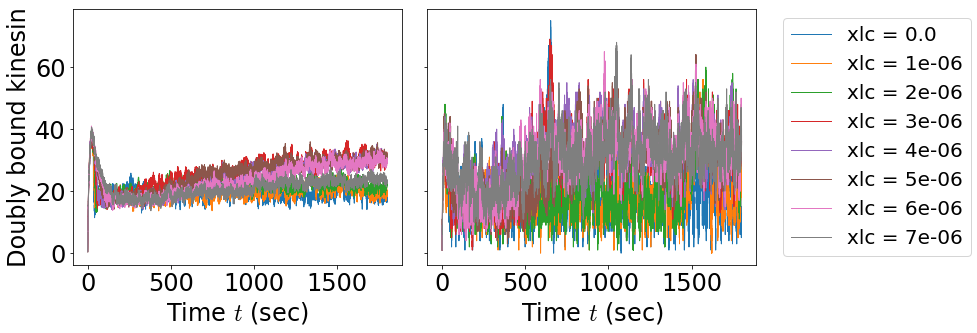

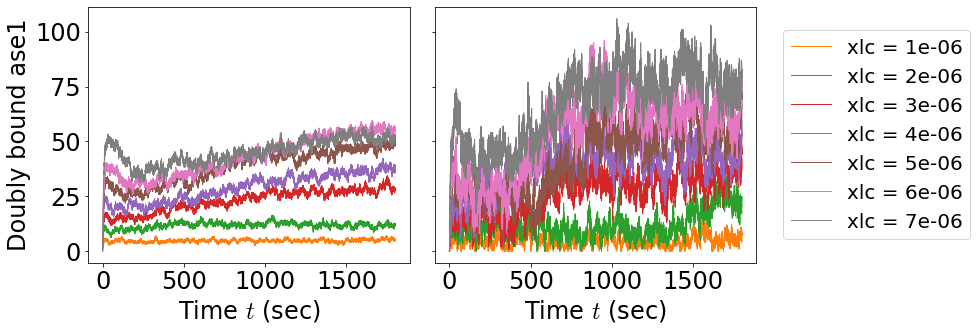

In [39]:
dir_path = ot_path / '21-07-06_CG_OT_scan8.16_stat_kin5_ase1_5um_koD.055_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 0.0, xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  
xlc = 1e-06, xlc = 2e-06, xlc = 3e-06, xlc = 4e-06, xlc = 5e-06, xlc = 6e-06, xlc = 7e-06,  


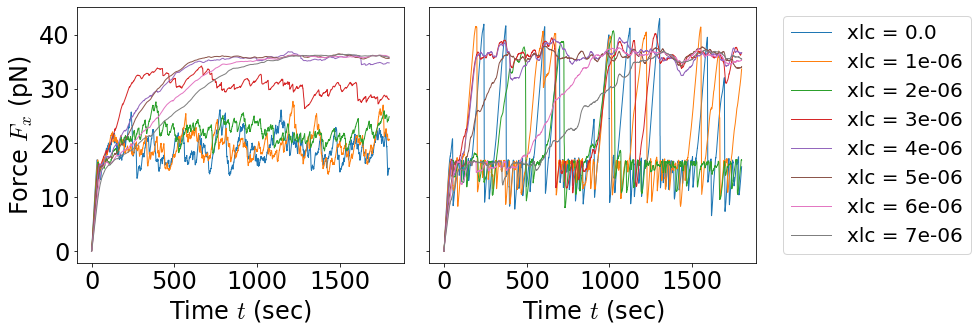

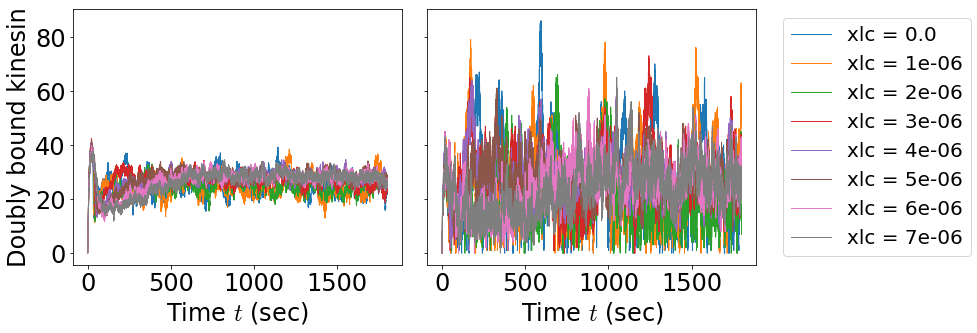

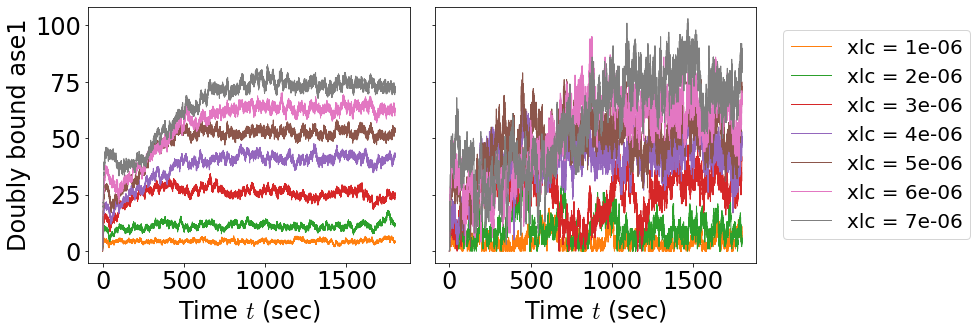

In [40]:
dir_path = ot_path / '21-07-06_CG_OT_scan8.16_stat_kin5_ase1_5um_XlkoD.055_conc1e-6_ok1_cstr'
make_force_kin_ase1_graphs(dir_path, 'xlc')

# Avalanche dynamics analysis

In [ ]:
def collect_contiguous_intervals(arr, delta):
    arr_deriv = np.gradient(arr, delta)
    
    # Get a matrix of indices. First column is starting point of positive interval, second column is ending point of positive interval
    contig_idx_arr = contiguous_regions(arr_deriv > 0)
    start_pos = contig_idx_arr[:,0]
    end_pos = contig_idx_arr[:,1]
    pos_lengths = (end_pos-start_pos)*1.
    neg_lengths = (start_pos[1:]-end_pos[:-1])*1.
    
    return arr_deriv, contig_idx_arr, pos_lengths, neg_lengths

In [ ]:
#High concentration no-energy-dependence zrl motors
try:
    #edep_dirs = (dir_path / 'simulations').glob('Edep0*[!8-9]')
    data_path = ot_path / '20-10-16_CG_OT_scan10.20_stat_rigid_zl-kin5_Edep0.0-1.0/simulations/Edep0/s0/ot_test_data.h5'
    h5_data = h5py.File(data_path, 'r')
    
    time, ot_force = get_ot_force(h5_data, species_name = 'filament-trap')
    dt = time[1]-time[0]
    ot_force_smooth = savgol_filter(-ot_force[:,1], 45, 3)
    ot_force_deriv, contig_arr, pos_lengths, neg_lengths = collect_contiguous_intervals(ot_force_smooth, dt)
    
    fig, axarr = plt.subplots(2,3, figsize=(18,10))
    
    axarr[0,0].set_title('Raw')
    axarr[0,0].plot(time*sec, -ot_force[:,1]*pN)
    # Smooth force using Savitsky-Golay filter with 3rd-order polynomial and window of 45 points (.45 sec)
    axarr[0,1].set_title('Smoothed \n (Savitsky-Golay p=3, w=.45 sec)')
    axarr[0,1].plot(time*sec, ot_force_smooth*pN)
    
    axarr[0,2].set_title('Derivative of smoothed force')
    axarr[0,2].plot(time*sec, ot_force_deriv*pN/sec)
    
    pos_lengths *= dt*sec
    neg_lengths *= dt*sec
    
    axarr[1,0].set_title('Increasing force intervals')
    axarr[1,0].hist(pos_lengths)
    axarr[1,1].set_title('Decreasing force intervals')
    axarr[1,1].hist(neg_lengths)
    
    for ax in axarr.flatten()[:-1]:
        ax.set_xlabel('Time $t$ (sec)')
    
    axarr[0,0].set_ylabel('Force $F_x$ (pN)')
    axarr[0,2].set_ylabel('$dF_x/dt$ (pN/sec)')
    axarr[1,0].set_ylabel("Number of intervals")
    
    
    #param_scan_force_plot(axarr, edep_dirs, "Edep")
    plt.tight_layout()
except:
    raise
finally:
    h5_data.close()


In [ ]:
# High concentration energy-dependent (Edep = .1) zrl motors
try:
    #edep_dirs = (dir_path / 'simulations').glob('Edep0*[!8-9]')
    data_path = ot_path / '20-10-16_CG_OT_scan10.20_stat_rigid_zl-kin5_Edep0.0-1.0/simulations/Edep0.1/s0/ot_test_data.h5'
    h5_data = h5py.File(data_path, 'r')
    
    time, ot_force = get_ot_force(h5_data, species_name = 'filament-trap')
    dt = time[1]-time[0]
    ot_force_smooth = savgol_filter(-ot_force[:,1], 45, 3)
    ot_force_deriv, contig_arr, pos_lengths, neg_lengths = collect_contiguous_intervals(ot_force_smooth, dt)
    
    fig, axarr = plt.subplots(2,3, figsize=(18,10))
    
    axarr[0,0].set_title('Raw')
    axarr[0,0].plot(time*sec, -ot_force[:,1]*pN)
    # Smooth force using Savitsky-Golay filter with 3rd-order polynomial and window of 45 points (.45 sec)
    axarr[0,1].set_title('Smoothed \n (Savitsky-Golay p=3, w=.45 sec)')
    axarr[0,1].plot(time*sec, ot_force_smooth*pN)
    
    axarr[0,2].set_title('Derivative of smoothed force')
    axarr[0,2].plot(time*sec, ot_force_deriv*pN/sec)
    
    pos_lengths *= dt*sec
    neg_lengths *= dt*sec
    
    axarr[1,0].set_title('Increasing force intervals')
    axarr[1,0].hist(pos_lengths)
    axarr[1,1].set_title('Decreasing force intervals')
    axarr[1,1].hist(neg_lengths)
    
    for ax in axarr.flatten()[:-1]:
        ax.set_xlabel('Time $t$ (sec)')
    
    axarr[0,0].set_ylabel('Force $F_x$ (pN)')
    axarr[0,2].set_ylabel('$dF_x/dt$ (pN/sec)')
    axarr[1,0].set_ylabel("Number of intervals")
    
    
    #param_scan_force_plot(axarr, edep_dirs, "Edep")
    plt.tight_layout()
except:
    raise
finally:
    h5_data.close()


In [ ]:
# High concentration energy-dependent (Edep = .5) zrl motors
try:
    #edep_dirs = (dir_path / 'simulations').glob('Edep0*[!8-9]')
    data_path = ot_path / \
        '20-10-16_CG_OT_scan10.20_stat_rigid_zl-kin5_Edep0.0-1.0/simulations/Edep0.5/s0/ot_test_data.h5'
    h5_data = h5py.File(data_path, 'r')

    time, ot_force = get_ot_force(h5_data, species_name='filament-trap')
    dt = time[1]-time[0]
    ot_force_smooth = savgol_filter(-ot_force[:, 1], 45, 3)
    ot_force_deriv, contig_arr, pos_lengths, neg_lengths = collect_contiguous_intervals(
        ot_force_smooth, dt)

    fig, axarr = plt.subplots(2, 3, figsize=(18, 10))

    axarr[0, 0].set_title('Raw')
    axarr[0, 0].plot(time*sec, -ot_force[:, 1]*pN)
    # Smooth force using Savitsky-Golay filter with 3rd-order polynomial and window of 45 points (.45 sec)
    axarr[0, 1].set_title('Smoothed \n (Savitsky-Golay p=3, w=.45 sec)')
    axarr[0, 1].plot(time*sec, ot_force_smooth*pN)

    axarr[0, 2].set_title('Derivative of smoothed force')
    axarr[0, 2].plot(time*sec, ot_force_deriv*pN/sec)

    pos_lengths *= dt*sec
    neg_lengths *= dt*sec

    axarr[1, 0].set_title('Increasing force intervals')
    axarr[1, 0].hist(pos_lengths)
    axarr[1, 1].set_title('Decreasing force intervals')
    axarr[1, 1].hist(neg_lengths)

    for ax in axarr.flatten()[:-1]:
        ax.set_xlabel('Time $t$ (sec)')

    axarr[0, 0].set_ylabel('Force $F_x$ (pN)')
    axarr[0, 2].set_ylabel('$dF_x/dt$ (pN/sec)')
    axarr[1, 0].set_ylabel("Number of intervals")

    plt.tight_layout()
except:
    raise
finally:
    h5_data.close()

In [ ]:
# High concentration, Edep = 0, zrl aggregation
try:
    sim_path = ot_path / \
        '20-10-16_CG_OT_scan10.20_stat_rigid_zl-kin5_Edep0.0-1.0/simulations/Edep0'
    seed_paths = sim_path.glob('s*')

    pos_length_arr = None
    neg_length_arr = None

    fig, axarr = plt.subplots(1, 3, figsize=(18, 5))
    for s in seed_paths:
        h5_data = h5py.File(s / 'ot_test_data.h5', 'r')
        time, ot_force = get_ot_force(h5_data)

        dt = time[1]-time[0]
        ot_force_smooth = savgol_filter(-ot_force[:, 1], 45, 3)
        axarr[0].plot(time*sec, ot_force_smooth*pN)

        ot_force_deriv, contig_arr, pos_lengths, neg_lengths = collect_contiguous_intervals(
            ot_force_smooth, dt)
        if pos_length_arr is None:
            pos_length_arr = pos_lengths
        else:
            pos_length_arr = np.concatenate(
                (pos_length_arr, pos_lengths), axis=None)
        if neg_length_arr is None:
            neg_length_arr = neg_lengths
        else:
            neg_length_arr = np.concatenate(
                (neg_length_arr, neg_lengths), axis=None)

        h5_data.close()

    pos_length_arr *= dt*sec
    neg_length_arr *= dt*sec

    axarr[1].hist(pos_length_arr, bins=20, log=True)
    axarr[2].hist(neg_length_arr, bins=20, log=True)

    #axarr[1].set_title('Increasing force intervals')
    #axarr[2].set_title('Decreasing force intervals')
    axarr[0].set_ylabel("Force (pN)")
    axarr[1].set_ylabel("Number of intervals")
    for ax in axarr:
        ax.set_xlabel("Time (sec)")

    plt.tight_layout()
except:
    raise
finally:
    pass
    # h5_data.close()

In [ ]:
# High concentration, Edep = .1, zrl aggregation
try:
    sim_path = Path.home() / 'projects/DATA/Optical-Traps/20-10-16_CG_OT_scan10.20_stat_rigid_zl-kin5_Edep0.0-1.0/simulations/Edep0.1'
    seed_paths = sim_path.glob('s*')
    
    pos_length_arr = None
    neg_length_arr = None
    
    fig, axarr = plt.subplots(1,3, figsize=(18,5))
    for s in seed_paths:
        h5_data = h5py.File(s / 'ot_test_data.h5', 'r')
        time, ot_force = get_ot_force(h5_data)
        
        dt = time[1]-time[0]
        ot_force_smooth = savgol_filter(-ot_force[:,1], 45, 3)
        axarr[0].plot(time*sec, ot_force_smooth*pN)
        
        ot_force_deriv, contig_arr, pos_lengths, neg_lengths = collect_contiguous_intervals(ot_force_smooth, dt)    
        if pos_length_arr is None:
            pos_length_arr = pos_lengths
        else:
            pos_length_arr = np.concatenate((pos_length_arr, pos_lengths), axis=None)
        if neg_length_arr is None:
            neg_length_arr = neg_lengths
        else:
            neg_length_arr = np.concatenate((neg_length_arr, neg_lengths), axis=None)

        h5_data.close()

    
    pos_length_arr *= dt*sec
    neg_length_arr *= dt*sec
    
    
    axarr[1].hist(pos_length_arr, bins=20, log=True)
    axarr[2].hist(neg_length_arr, bins=20, log=True)
    
    axarr[0].set_ylabel("Force (pN)")
    axarr[1].set_ylabel("Number of intervals")
    for ax in axarr:
        ax.set_xlabel("Time (sec)")
    
    plt.tight_layout()
except:
    raise
finally:
    pass
    #h5_data.close()


In [ ]:
# High concentration, Edep = .5, zrl aggregation
try:
    sim_path = Path.home() / 'projects/DATA/Optical-Traps/20-10-16_CG_OT_scan10.20_stat_rigid_zl-kin5_Edep0.0-1.0/simulations/Edep0.5'
    seed_paths = sim_path.glob('s*')

    pos_length_arr = None
    neg_length_arr = None

    fig, axarr = plt.subplots(1, 3, figsize=(18, 5))
    for s in seed_paths:
        h5_data = h5py.File(s / 'ot_test_data.h5', 'r')
        time, ot_force = get_ot_force(h5_data)

        dt = time[1]-time[0]
        ot_force_smooth = savgol_filter(-ot_force[:, 1], 45, 3)
        axarr[0].plot(time*sec, ot_force_smooth*pN)

        ot_force_deriv, contig_arr, pos_lengths, neg_lengths = collect_contiguous_intervals(
            ot_force_smooth, dt)
        if pos_length_arr is None:
            pos_length_arr = pos_lengths
        else:
            pos_length_arr = np.concatenate(
                (pos_length_arr, pos_lengths), axis=None)
        if neg_length_arr is None:
            neg_length_arr = neg_lengths
        else:
            neg_length_arr = np.concatenate(
                (neg_length_arr, neg_lengths), axis=None)

        h5_data.close()

    pos_length_arr *= dt*sec
    neg_length_arr *= dt*sec

    axarr[1].hist(pos_length_arr, bins=20, log=True)
    axarr[2].hist(neg_length_arr, bins=20, log=True)

    axarr[0].set_ylabel("Force (pN)")
    axarr[1].set_ylabel("Number of intervals")
    for ax in axarr:
        ax.set_xlabel("Time (sec)")

    plt.tight_layout()
except:
    raise
finally:
    pass
    # h5_data.close()

In [ ]:
# High concentration, Edep = .8, zrl aggregation
try:
    sim_path = Path.home() / 'projects/DATA/Optical-Traps/20-10-16_CG_OT_scan10.20_stat_rigid_zl-kin5_Edep0.0-1.0/simulations/Edep0.8'
    seed_paths = sim_path.glob('s*')

    pos_length_arr = None
    neg_length_arr = None

    fig, axarr = plt.subplots(1, 3, figsize=(18, 5))
    for s in seed_paths:
        h5_data = h5py.File(s / 'ot_test_data.h5', 'r')
        time, ot_force = get_ot_force(h5_data)

        dt = time[1]-time[0]
        ot_force_smooth = savgol_filter(-ot_force[:, 1], 45, 3)
        axarr[0].plot(time*sec, ot_force_smooth*pN)

        ot_force_deriv, contig_arr, pos_lengths, neg_lengths = collect_contiguous_intervals(
            ot_force_smooth, dt)
        if pos_length_arr is None:
            pos_length_arr = pos_lengths
        else:
            pos_length_arr = np.concatenate(
                (pos_length_arr, pos_lengths), axis=None)
        if neg_length_arr is None:
            neg_length_arr = neg_lengths
        else:
            neg_length_arr = np.concatenate(
                (neg_length_arr, neg_lengths), axis=None)

        h5_data.close()

    pos_length_arr *= dt*sec
    neg_length_arr *= dt*sec

    axarr[1].hist(pos_length_arr, bins=20, log=True)
    axarr[2].hist(neg_length_arr, bins=20, log=True)

    axarr[0].set_ylabel("Force (pN)")
    axarr[1].set_ylabel("Number of intervals")
    for ax in axarr:
        ax.set_xlabel("Time (sec)")

    plt.tight_layout()
except:
    raise
finally:
    h5_data.close()